# Volcanic composites with priors

In [1]:
import sys
import numpy as np
import pickle
import pandas as pd
import sys

from scipy import stats
from scipy import signal

import matplotlib.pyplot as plt

In [2]:
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

In [3]:
sys.path.insert(1,'/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/')
import commonera_utils as ce_utils 

In [4]:
plt.rcParams['figure.dpi']=300

In [5]:
def recon_preprocess(var, time, anom_start, anom_end): 
    # Find indices to take anomalies over: 
    anom_ind = np.where((time<anom_end)&(time>=anom_start))
    
    var_2d = np.reshape(var,(var.shape[0],var.shape[1]*var.shape[2]))
    var_anom_2d = var_2d - np.nanmean(np.squeeze(var_2d[anom_ind,:]),axis=0)
    var_anom_mn = np.nanmean(var_anom_2d,axis=1)

    var_97_5 = np.percentile(var_anom_2d,97.5,axis=1)
    var_2_5 = np.percentile(var_anom_2d,2.5,axis=1)
    
    return var_2d, var_anom_2d, var_anom_mn , var_97_5, var_2_5

In [6]:
def load_recon_allit(output_dir,filename,niter,prox_loc=True):

    for it in range(niter):
        output_file = filename[:-5]+str(it)+'.pkl'

        if prox_loc is True: 
            [sic_lalo, tas_lalo, sic_ens_var, 
             nobs, sia_ens, sie_ens, recon_years, 
             Ye_assim, Ye_assim_coords, Xb_inflate, proxy_assim_loc] = load_recon(output_dir+output_file)          
        else: 
            [sic_lalo, tas_lalo, sic_ens_var, 
             nobs, sia_ens, sie_ens, recon_years, 
             Ye_assim, Ye_assim_coords, Xb_inflate] = load_recon(output_dir+output_file, prox_loc=False)

        if it is 0: 
            sic_lalo_allit = np.zeros((sic_lalo.shape[0],sic_lalo.shape[1],sic_lalo.shape[2],niter))
            tas_lalo_allit = np.zeros((tas_lalo.shape[0],tas_lalo.shape[1],tas_lalo.shape[2],niter))
            sic_ens_var_allit = np.zeros(niter)
            nobs_allit = np.zeros((nobs.shape[0],niter))
            sia_ens_allit = np.zeros((sia_ens.shape[0],sia_ens.shape[1],niter))
            sie_ens_allit = np.zeros((sie_ens.shape[0],sie_ens.shape[1],niter))
            Ye_assim_allit = np.zeros((Ye_assim.shape[0],Ye_assim.shape[1],niter))
            Ye_assim_coords_allit = np.zeros((Ye_assim_coords.shape[0],Ye_assim_coords.shape[1],niter))
            Xb_inflate_allit = np.zeros((Xb_inflate.shape[0],Xb_inflate.shape[1],niter))
            if prox_loc is True: 
                proxy_assim_loc_allit = {}

        sic_lalo_allit[:,:,:,it] = sic_lalo
        tas_lalo_allit[:,:,:,it] = tas_lalo
        sic_ens_var_allit[it] = niter
        nobs_allit[:,it] = nobs
        sia_ens_allit[:,:,it] = sia_ens
        sie_ens_allit[:,:,it] = sie_ens
        Ye_assim_allit[:,:,it] = Ye_assim
        Ye_assim_coords_allit[:,:,it] = Ye_assim_coords
        Xb_inflate_allit[:,:,it] = Xb_inflate
        if prox_loc is True: 
            proxy_assim_loc_allit['iter '+str(it)] = proxy_assim_loc
        
    if prox_loc is True:        
        return (sic_lalo_allit, tas_lalo_allit, sic_ens_var_allit, nobs_allit, 
                sia_ens_allit, sie_ens_allit, Ye_assim_allit, Ye_assim_coords_allit, 
                Xb_inflate_allit,recon_years, proxy_assim_loc_allit)
    else: 
        return (sic_lalo_allit, tas_lalo_allit, sic_ens_var_allit, nobs_allit, 
                sia_ens_allit, sie_ens_allit, Ye_assim_allit, Ye_assim_coords_allit, 
                Xb_inflate_allit,recon_years)

In [7]:
def load_recon(LOC, prox_loc=True):
    recon = pickle.load(open(LOC,'rb'))
    
    sic_lalo = recon['sic_lalo']
    tas_lalo = recon['tas_lalo']
    sic_ens_var = recon['sic_ens_var']
    nobs = recon['nobs']
    sia_ens = recon['sia_ens']
    sie_ens = recon['sie_ens']
    recon_years = recon['recon_years']
    Ye_assim = recon['Ye_assim']
    Ye_assim_coords = recon['Ye_assim_coords']
    Xb_inflate = recon['Xb_inflate'] 
    
    if prox_loc is True: 
        proxy_assim_loc = recon['proxy_assim_loc']
    
        return (sic_lalo, tas_lalo, sic_ens_var, nobs, sia_ens, sie_ens, recon_years, 
                Ye_assim, Ye_assim_coords, Xb_inflate, proxy_assim_loc)
    else: 
        return (sic_lalo, tas_lalo, sic_ens_var, nobs, sia_ens, sie_ens, recon_years, 
                Ye_assim, Ye_assim_coords, Xb_inflate)

In [8]:
def load_ccsm4_lm_regridded():
    ccsm4_dir = '/home/disk/chaos/mkb22/Documents/SeaIceData/CCSM4/CCSM4_last_millennium/'
    ccsm4_file = 'ccsm4_sic_sit_tas_20CRv2_850_1850_full.npz'

    ccsm4_lm = np.load(ccsm4_dir+ccsm4_file)

    ccsm4_truth_sic = ccsm4_lm['sic_ccsm4']
    ccsm4_truth_sit = ccsm4_lm['sit_ccsm4']
    ccsm4_truth_tas = ccsm4_lm['tas_ccsm4']
    ccsm4_truth_lat = ccsm4_lm['lat_ccsm4']
    ccsm4_truth_lon = ccsm4_lm['lon_ccsm4']
    
    return ccsm4_truth_tas, ccsm4_truth_sic, ccsm4_truth_sit, ccsm4_truth_lat, ccsm4_truth_lon

In [9]:
def load_mpi_lm_regridded():
    mpi_dir = '/home/disk/chaos/mkb22/Documents/SeaIceData/MPI/'
    mpi_file = 'mpi_sic_sit_tas_20CRv2_850_1850_full.npz'

    mpi_lm = np.load(mpi_dir+mpi_file)

    mpi_truth_sic = mpi_lm['sic_mpi']
    mpi_truth_sit = mpi_lm['sit_mpi']
    mpi_truth_tas = mpi_lm['tas_mpi']
    mpi_truth_lat = mpi_lm['lat_mpi']
    mpi_truth_lon = mpi_lm['lon_mpi']
    
    return mpi_truth_tas, mpi_truth_sic, mpi_truth_sit, mpi_truth_lat, mpi_truth_lon

In [10]:
anom_start = 850
anom_end = 1850

## Load priors: 

In [11]:
[ccsm4_truth_tas, ccsm4_truth_sic, 
 ccsm4_truth_sit,
 ccsm4_truth_lat, ccsm4_truth_lon] = load_ccsm4_lm_regridded()

ccsm4_truth_time = np.arange(850,1851,1)

In [12]:
[sia_nh_ccsm4_truth, sie_nh_ccsm4_truth, 
 sia_nh_ccsm4_truth_anom, sie_nh_ccsm4_truth_anom,
 sia_sh_ccsm4_truth, sie_sh_ccsm4_truth, 
 sia_sh_ccsm4_truth_anom, 
 sie_sh_ccsm4_truth_anom] = ce_utils.calc_lm_tot_si(ccsm4_truth_sic,ccsm4_truth_lat, 
                                                    ccsm4_truth_time, anom_start, anom_end)

In [13]:
[mpi_truth_tas, mpi_truth_sic, 
 mpi_truth_sit,
 mpi_truth_lat, mpi_truth_lon] = load_mpi_lm_regridded()

mpi_time = np.arange(850,1850,1)

In [14]:
[sia_nh_mpi, sie_nh_mpi, 
 sia_nh_mpi_anom, sie_nh_mpi_anom,
 sia_sh_mpi, sie_sh_mpi, 
 sia_sh_mpi_anom, sie_sh_mpi_anom] = ce_utils.calc_lm_tot_si(mpi_truth_sic,mpi_truth_lat, 
                                                             mpi_time, anom_start, anom_end)

## Load reconstructions:

In [15]:
output_dir_ccsm4 = '/home/disk/p/mkb22/nobackup/LMR_output/common_era_experiments/experiments/ccsm4/'
#output_file_ccsm4 = 'sic_ccsm4_anrecon_0_2000_pages2kv2_inf2_6_loc15000_iter0.pkl'
output_file_ccsm4 = 'sic_ccsm4_anrecon_revisions1_0_2000_pages2kv2_inf2_6_loc15000_iter0.pkl'

niter = 10

[sic_lalo_allit_ccsm4, tas_lalo_allit_ccsm4, sic_ens_var_allit_ccsm4, 
 nobs_allit_ccsm4, sia_ens_allit_ccsm4, sie_ens_allit_ccsm4, Ye_assim_allit_ccsm4, 
 Ye_assim_coords_allit_ccsm4, Xb_inflate_allit_ccsm4, recon_years_ccsm4, 
 proxy_assim_loc_allit_ccsm4] = load_recon_allit(output_dir_ccsm4,output_file_ccsm4,niter)

In [16]:
[sie_ens_allit_2d_ccsm4, 
 sie_ens_anom_allit_ccsm4, 
 sie_ensmn_anom_allit_ccsm4, 
 sie_97_5_allit_ccsm4, 
 sie_2_5_allit_ccsm4] = recon_preprocess(sie_ens_allit_ccsm4, np.array(recon_years_ccsm4), anom_start, anom_end)

In [17]:
output_dir_mpi = '/home/disk/p/mkb22/nobackup/LMR_output/common_era_experiments/experiments/mpi/'
#output_file_mpi = 'sic_mpi_anrecon_0_2000_pages2kv2_inf1_8_loc15000_iter0.pkl'
output_file_mpi = 'sic_mpi_anrecon_revisions1_0_2000_pages2kv2_inf1_8_loc15000_iter0.pkl'

[sic_lalo_allit_mpi, tas_lalo_allit_mpi, sic_ens_var_allit_mpi, 
 nobs_allit_mpi, sia_ens_allit_mpi, sie_ens_allit_mpi, Ye_assim_allit_mpi, 
 Ye_assim_coords_allit_mpi, Xb_inflate_allit_mpi, recon_years, 
 proxy_assim_loc_allit_mpi] = load_recon_allit(output_dir_mpi,output_file_mpi,niter)

In [18]:
[sie_ens_allit_2d_mpi, 
 sie_ens_anom_allit_mpi, 
 sie_ensmn_anom_allit_mpi, 
 sie_97_5_allit_mpi, 
 sie_2_5_allit_mpi] = recon_preprocess(sie_ens_allit_mpi, np.array(recon_years), anom_start, anom_end)

## Load volcanic forcing data (Sigl et al 2015):

In [19]:
sigl_dir = '/home/disk/chaos/mkb22/Documents/SeaIceData/Sigl2015/sigl_etal_2015_fig3_data.csv'

sigl_data = pd.read_csv(sigl_dir)
sigl_data.head()

,Start Year,Global forcing (40 largest),Start Year .1,Global forcing (tropical),Start Year .2,Global forcing (NH),Start Year .3,Global forcing (SH)
0,BCE/CE,W [m-2],BCE/CE,W [m-2],BCE/CE,W [m-2],BCE/CE,W [m-2]
1,-426,-35.6,1992,-6.5,1957,-1.0,1979,-0.4
2,1258,-32.8,1982,-0.4,1947,-0.6,1931,-0.3
3,-44,-23.2,1968,-0.4,1926,-1.8,1890,-0.4
4,1458,-20.6,1964,-3.8,1925,-1.0,1887,-0.8


In [20]:
sigl_nh_volc_forc = np.zeros((116))
sigl_nh_volc_yrs = np.zeros((116))

for i in range(116):
    sigl_nh_volc_yrs[i] = int(sigl_data['Start Year .2'][i+1])
    sigl_nh_volc_forc[i] = float(sigl_data['Global forcing (NH)'][i+1])
    
sigl_nh_full_forc = np.zeros((2001))

for iyr,yr in enumerate(sigl_nh_volc_yrs):
    sigl_nh_full_forc[int(yr)] = sigl_nh_volc_forc[iyr]

In [21]:
sigl_trop_volc_forc = np.zeros((62))
sigl_trop_volc_yrs = np.zeros((62))

for i in range(62):
    sigl_trop_volc_yrs[i] = int(sigl_data['Start Year .1'][i+1])
    sigl_trop_volc_forc[i] = float(sigl_data['Global forcing (tropical)'][i+1])
    
sigl_trop_full_forc = np.zeros((2001))

for iyr,yr in enumerate(sigl_trop_volc_yrs):
    sigl_trop_full_forc[int(yr)] = sigl_trop_volc_forc[iyr]

## Composite analysis: 
### Extract forcing and years of 40 largest eruptions: 

In [22]:
sigl_40lg_forc = []
sigl_40lg_yrs = []

for i in range(40): 
    if (int(sigl_data['Start Year '][i+1])>=0)&(int(sigl_data['Start Year '][i+1])<=1980):
        sigl_40lg_forc.append(float(sigl_data['Global forcing (40 largest)'][i+1]))
        sigl_40lg_yrs.append(int(sigl_data['Start Year '][i+1]))
        
sigl_40lg_forc_full = np.zeros((2001))        
for y,yr in enumerate(sigl_40lg_yrs):
    sigl_40lg_forc_full[yr] = np.array(sigl_40lg_forc)[y]

In [23]:
sigl_40lg_yr_trop = (set(sigl_40lg_yrs) - set(sigl_nh_volc_yrs))
sigl_40lg_yr_nh = (set(sigl_40lg_yrs) - set(sigl_trop_volc_yrs))

len(sigl_40lg_yr_trop),len(sigl_40lg_yr_nh)

(24, 7)

### Filter out eruptions that are within 10 years of each other: 

In [24]:
volc_40time = np.sort(sigl_40lg_yrs)
volc_time_diff = np.array(volc_40time)[1:] - np.array(volc_40time)[:-1] 
volc_time_diff

array([ 82,  97, 167, 103,   4,  34,  52,  56,  68,  67,  99,  23, 169,
        63,  20,  39,  28,  18,  10,  59, 108,   5, 143,  40,  54,  88,
        26,   6,  17,   4])

In [25]:
volc_40_time_norep = []

for t in range(len(volc_time_diff)):
    if volc_time_diff[t] >10:
        volc_40_time_norep.append(volc_40time[t])
        
volc_40_time_norep.append(volc_40time[-1])

In [26]:
sie_ens_allit_2d_ccsm4.shape

(2000, 2000)

In [27]:
lm_volc_40 = [i for i in volc_40_time_norep if i>850]

nvolc = len(lm_volc_40)
sie_allit_volc_ccsm4 = np.zeros((26,nvolc))
sie_allit_volc_mpi = np.zeros((26,nvolc))
sie_allit_ccsm4_recon= np.zeros((26,nvolc,2000))
sie_allit_mpi_recon= np.zeros((26,nvolc,2000))

for i,volc_yr in enumerate(lm_volc_40[:-1]):
    lm_volc_yr = volc_yr - 850
    mn_ccsm4 = np.nanmean(sie_nh_ccsm4_truth_anom[int(lm_volc_yr-5):lm_volc_yr],axis=0) 
    sie_allit_volc_ccsm4[:,i] = sie_nh_ccsm4_truth_anom[int(lm_volc_yr-5):int(lm_volc_yr+21)] - mn_ccsm4
    
    mn_mpi = np.nanmean(sie_nh_mpi_anom[int(lm_volc_yr-5):lm_volc_yr],axis=0) 
    sie_allit_volc_mpi[:,i] = sie_nh_mpi_anom[int(lm_volc_yr-5):int(lm_volc_yr+21)] - mn_mpi
    
    mn_ccsm4_recon = np.nanmean(sie_ens_allit_2d_ccsm4[int(volc_yr-5):volc_yr,:],axis=0) 
    sie_allit_ccsm4_recon[:,i,:] = sie_ens_allit_2d_ccsm4[int(volc_yr-5):int(volc_yr+21),:] - mn_ccsm4_recon
    
    mn_mpi_recon = np.nanmean(sie_ens_allit_2d_mpi[int(volc_yr-5):volc_yr,:],axis=0) 
    sie_allit_mpi_recon[:,i,:] = sie_ens_allit_2d_mpi[int(volc_yr-5):int(volc_yr+21),:] - mn_mpi_recon

# sie_allit_volc_2d = np.reshape(sie_allit_volc,(26,nvolc*2000))
# sie_enmn_allvolc_2d = np.nanmean(sie_allit_volc_2d,axis=1)

In [28]:
sie_allit_volc_2d = np.reshape(sie_allit_ccsm4_recon,(26,nvolc*2000))
sie_enmn_allvolc_ccsm4_recon = np.nanmean(sie_allit_volc_2d,axis=1)

sie_allit_volc_2d_mpi = np.reshape(sie_allit_mpi_recon,(26,nvolc*2000))
sie_enmn_allvolc_mpi_recon = np.nanmean(sie_allit_volc_2d_mpi,axis=1)

### Significance testing: 

In [29]:
# sie_enmn_allvolc = np.nanmean(sie_allit_volc,axis=2)

stat, p = stats.ttest_1samp(sie_allit_volc_mpi,0, axis=1)
ttest_sig_mpi = (p<0.05)
p

array([6.46971673e-01, 4.00444291e-01, 5.62510242e-01, 9.29989242e-01,
       6.84637333e-01, 3.14251497e-01, 2.47242594e-02, 1.12664534e-02,
       4.81984028e-03, 1.58255894e-03, 3.85854778e-04, 3.03381321e-03,
       1.45258943e-02, 2.67557547e-01, 6.99761653e-01, 9.88184968e-01,
       9.38657079e-01, 9.39295812e-01, 9.75324663e-01, 9.17841977e-01,
       5.96525074e-01, 7.23082006e-01, 8.00018716e-01, 4.29747899e-01,
       7.83672156e-01, 9.75988740e-01])

In [30]:
# sie_enmn_allvolc = np.nanmean(sie_allit_volc,axis=2)

stat, p = stats.ttest_1samp(sie_allit_volc_ccsm4,0, axis=1)
ttest_sig_ccsm4 = (p<0.05)
p

array([0.90933204, 0.56234707, 0.59310709, 0.60666531, 0.38340814,
       0.81781072, 0.69529814, 0.95472045, 0.26755899, 0.42207332,
       0.62581905, 0.86312822, 0.67768408, 0.39691673, 0.36307504,
       0.1113161 , 0.19138703, 0.01552492, 0.0177143 , 0.27141901,
       0.01489045, 0.05076793, 0.04579982, 0.25963481, 0.05984819,
       0.11299446])

In [31]:
sie_enmn_allvolc_mpi = np.nanmean(sie_allit_mpi_recon,axis=2)

stat_mpi, p_mpi = stats.ttest_1samp(sie_enmn_allvolc_mpi,0, axis=1)
ttest_sig_mpi_recon = (p_mpi<0.05)
p_mpi

array([0.59808655, 0.20993969, 0.54837075, 0.53529251, 0.63662803,
       0.00397291, 0.00583646, 0.01946357, 0.00183406, 0.05748972,
       0.00259029, 0.07158391, 0.06921926, 0.12881804, 0.89512379,
       0.58541125, 0.43062704, 0.647294  , 0.74482109, 0.56500579,
       0.6451213 , 0.17448506, 0.67661716, 0.57886625, 0.51527955,
       0.8959129 ])

In [32]:
sie_enmn_allvolc = np.nanmean(sie_allit_ccsm4_recon,axis=2)

stat, p = stats.ttest_1samp(sie_enmn_allvolc,0, axis=1)
ttest_sig_ccsm4_recon = (p<0.05)
p

array([0.86834659, 0.64635428, 0.3432612 , 0.26170611, 0.62290871,
       0.00223141, 0.00157854, 0.02077913, 0.00153293, 0.13768994,
       0.00345997, 0.14849986, 0.11585257, 0.18992206, 0.60444903,
       0.23113392, 0.65925792, 0.72875666, 0.78854722, 0.68628547,
       0.7486024 , 0.30938801, 0.52233419, 0.40232888, 0.65797333,
       0.97583102])

In [33]:
sigtest_yrs = np.random.randint(0,1000,size=500)

In [34]:
sz = 26
sie_allit_randcomp_ccsm4_ensmn = np.zeros((1000,26))
sie_allit_randcomp_mpi_ensmn = np.zeros((1000,26))

for rn in range(1000):
    sigtest_yrs = np.random.randint(5,1000-21,size=sz)
    sie_allit_randcomp_ccsm4 = np.zeros((26,sz))
    sie_allit_randcomp_mpi = np.zeros((26,sz))

    for i,volc_yr in enumerate(sigtest_yrs):
        mn_ccsm4 = np.nanmean( sie_nh_ccsm4_truth_anom[int(volc_yr-5):volc_yr],axis=0) 
        sie_allit_randcomp_ccsm4[:,i] =  sie_nh_ccsm4_truth_anom[int(volc_yr-5):int(volc_yr+21)] - mn_ccsm4
        
        mn_mpi = np.nanmean( sie_nh_ccsm4_truth_anom[int(volc_yr-5):volc_yr],axis=0) 
        sie_allit_randcomp_mpi[:,i] =  sie_nh_mpi_anom[int(volc_yr-5):int(volc_yr+21)] - mn_mpi

    sie_allit_randcomp_ccsm4_ensmn[rn, :] = np.nanmean(sie_allit_randcomp_ccsm4,axis=1)
    sie_allit_randcomp_mpi_ensmn[rn, :] = np.nanmean(sie_allit_randcomp_mpi,axis=1)

In [35]:
sie_allit_randcomp_ccsm4_ensmn_97_5 = np.percentile(sie_allit_randcomp_ccsm4_ensmn,97.5,axis=0)
sie_allit_randcomp_ccsm4_ensmn_2_5 = np.percentile(sie_allit_randcomp_ccsm4_ensmn,2.5,axis=0)

sie_allit_randcomp_mpi_ensmn_97_5 = np.percentile(sie_allit_randcomp_mpi_ensmn,97.5,axis=0)
sie_allit_randcomp_mpi_ensmn_2_5 = np.percentile(sie_allit_randcomp_mpi_ensmn,2.5,axis=0)

## Plot: Figure 6

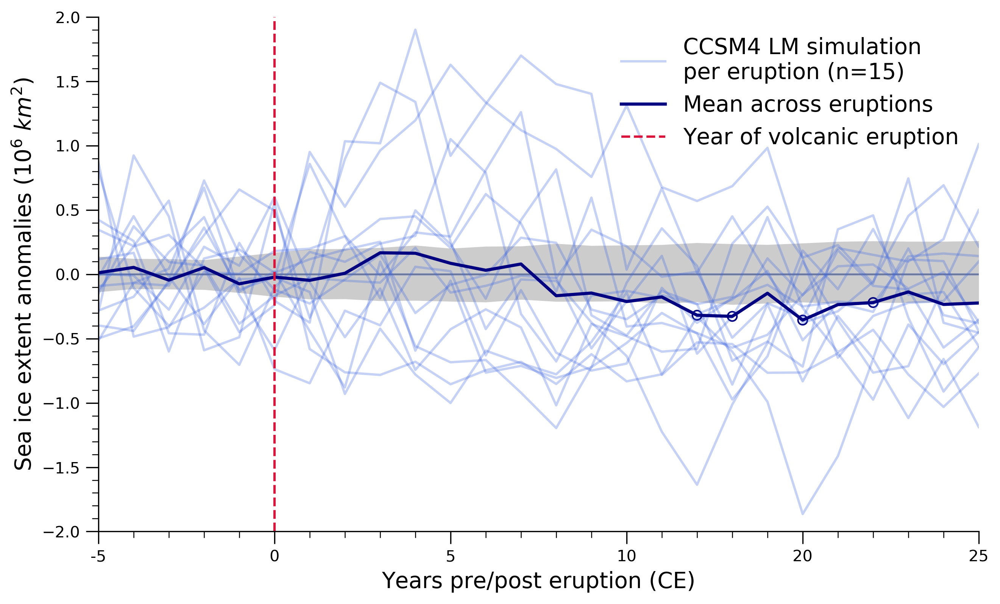

In [36]:
fig = plt.figure(figsize=(10,6))
plt.axhline(0, linestyle='-',color='gray', linewidth=1)

plt.fill_between(np.arange(0,26,1),sie_allit_randcomp_ccsm4_ensmn_2_5, sie_allit_randcomp_ccsm4_ensmn_97_5,
                 color='gray',alpha=0.4 ,lw=0.01)

for i in range(nvolc):
    if i is 0: 
        lab = 'CCSM4 LM simulation \nper eruption (n=15)'
    else: 
        lab = ''
    plt.plot(np.arange(0,26,1),sie_allit_volc_ccsm4[:,i], color='royalblue', alpha=0.3,
             label=lab, linewidth=1.5)
plt.plot(np.arange(0,26,1),np.nanmean(sie_allit_volc_ccsm4,axis=1), 
         color='navy', linewidth=2, label='Mean across eruptions')

for yr in range(26):
    if ttest_sig_ccsm4[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_allit_volc_ccsm4,axis=1)[yr], color='navy',
                    marker='o', s=35, facecolors='none')

x = [0,5,10,15,20,25,30]
labels = [-5,0,5,10,20,25]
plt.xticks(x,labels)
plt.xlabel('Years pre/post eruption (CE)', fontsize=14)
plt.ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)', fontsize=14)

ax = plt.gca()
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.tick_params(which='major', length=8)
ax.tick_params(which='minor', length=4)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.axvline(5,color='crimson', linestyle='--', linewidth=1.5, label='Year of volcanic eruption')

plt.legend(frameon=False, fontsize=14)
plt.xlim(0,25)
plt.ylim(-2,2)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'volc_sigl_2015_large_norep_composite.png'
#plt.savefig(savedir+savename)

In [37]:
np.nanmean(sie_allit_ccsm4_recon,axis=2)

array([[-4.67900322e-02, -1.16800104e-01, -9.42324289e-02,
         9.71503034e-03,  7.30355692e-02, -1.79084137e-01,
         5.54716971e-02, -2.88909691e-02, -1.74910612e-01,
         1.99484064e-01,  1.08209248e-01,  8.54088240e-03,
         3.59246913e-02,  7.07959563e-02,  1.10945140e-02,
         0.00000000e+00],
       [-1.30800935e-01, -1.96557314e-02, -1.30063281e-02,
        -2.13868569e-03, -3.97407364e-02,  7.08366169e-02,
         1.12725371e-01,  5.39379280e-02,  9.43803307e-02,
        -3.55470974e-02,  3.78283168e-02, -1.29959746e-02,
        -1.82994382e-01,  5.07374961e-02, -1.41054269e-01,
         0.00000000e+00],
       [ 6.10637869e-02,  1.15474347e-02,  7.50092308e-02,
        -2.78018761e-01, -2.11779478e-02, -1.38364690e-01,
        -2.01472627e-03, -1.28888014e-01, -3.44507493e-02,
         2.15661289e-03, -1.35048818e-01,  4.00690512e-02,
         2.31522078e-01,  6.75196955e-02, -2.59867453e-01,
         0.00000000e+00],
       [ 1.18661052e-01,  1.12138647e

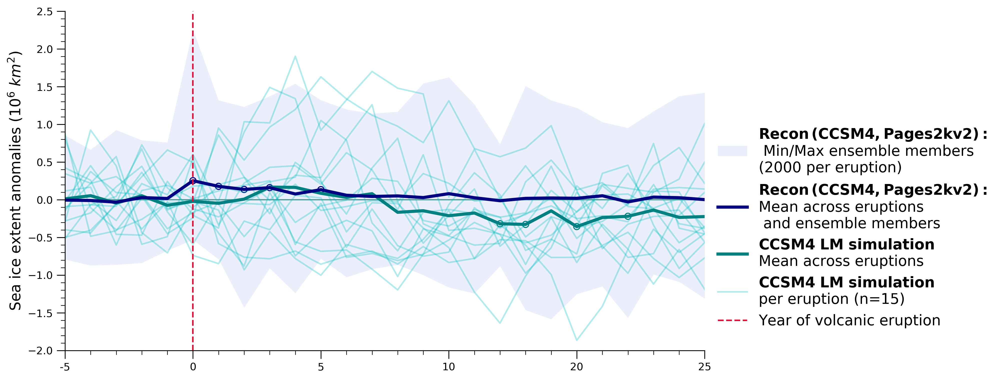

In [38]:
fig = plt.figure(figsize=(11,6))
plt.axhline(0, linestyle='-',color='gray', linewidth=1)

# plt.fill_between(np.arange(0,26,1),sie_allit_randcomp_ccsm4_ensmn_2_5, sie_allit_randcomp_ccsm4_ensmn_97_5,
#                  color='gray',alpha=0.4 ,lw=0.01)
plt.fill_between(np.arange(0,26,1),np.max(sie_allit_volc_2d,axis=1),
                            np.min(sie_allit_volc_2d,axis=1),
                            color='royalblue',alpha=0.1 ,lw=0.01, 
                            label=r'$\bf{Recon\,(CCSM4, Pages2kv2):}$'+'\n Min/Max ensemble members \n(2000 per eruption)')

for i in range(nvolc):
    if i is 0: 
        lab = lab = (r'$\bf{CCSM4}$'+' '+r'$\bf{LM}$'+' '+r'$\bf{simulation}$'+
               '\nper eruption (n=15)')
    else: 
        lab = ''
    plt.plot(np.arange(0,26,1),sie_allit_volc_ccsm4[:,i], color='c', alpha=0.3,
             label=lab, linewidth=1.5)
#     plt.plot(np.arange(0,26,1),np.nanmean(sie_allit_ccsm4_recon,axis=2)[:,i], color='royalblue', alpha=0.3,
#              label=lab, linewidth=1.5)
plt.plot(np.arange(0,26,1),np.nanmean(sie_allit_volc_ccsm4,axis=1), 
         color='teal', linewidth=3, label=(r'$\bf{CCSM4}$'+' '+r'$\bf{LM}$'+' '+r'$\bf{simulation}$'+
                                                    '\nMean across eruptions'))
plt.plot(np.arange(0,26,1),sie_enmn_allvolc_ccsm4_recon, 
         color='navy', linewidth=3, 
        label=r'$\bf{Recon\,(CCSM4, Pages2kv2):}$'+'\nMean across eruptions \n and ensemble members')

for yr in range(26):
    if ttest_sig_ccsm4[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_allit_volc_ccsm4,axis=1)[yr], color='teal',
                    marker='o', s=35, facecolors='none')
for yr in range(26):
    if ttest_sig_ccsm4_recon[yr] == True: 
        plt.scatter(yr,sie_enmn_allvolc_ccsm4_recon[yr], color='navy',
                    marker='o', s=35, facecolors='none')

x = [0,5,10,15,20,25,30]
labels = [-5,0,5,10,20,25]
plt.xticks(x,labels)
#plt.xlabel('Years pre/post eruption (CE)', fontsize=14)
plt.ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)', fontsize=14)

ax = plt.gca()
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.tick_params(which='major', length=8)
ax.tick_params(which='minor', length=4)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.axvline(5,color='crimson', linestyle='--', linewidth=1.5, label='Year of volcanic eruption')

handles, labels = plt.gca().get_legend_handles_labels()
h = [handles[4],handles[2],handles[1],handles[0],handles[3]]
l = [labels[4],labels[2],labels[1],labels[0],labels[3]]

plt.legend(h,l,bbox_to_anchor=(1.0, 0.7), frameon=False,fontsize=14)
plt.xlim(0,25)
plt.ylim(-2,2.5)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'volc_sigl_2015_large_norep_composite.png'
#plt.savefig(savedir+savename)

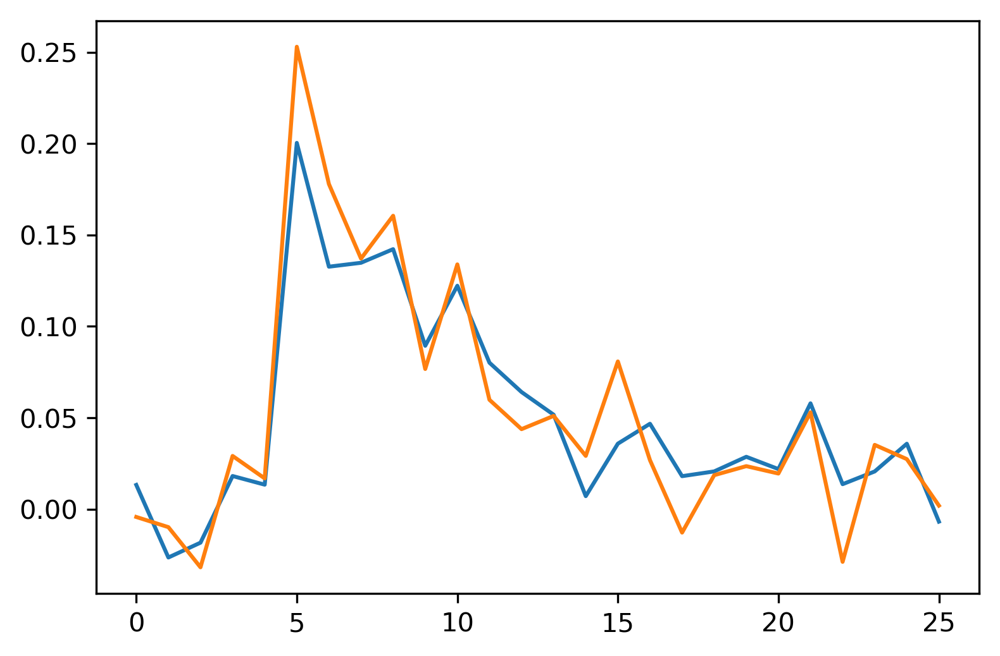

In [40]:
plt.plot(sie_enmn_allvolc_mpi_recon)
plt.plot(sie_enmn_allvolc_ccsm4_recon)

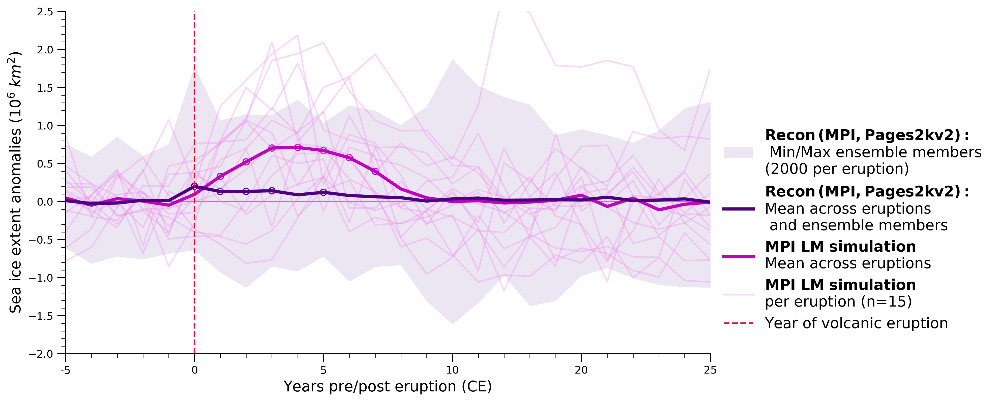

In [69]:
fig = plt.figure(figsize=(11,6))
plt.axhline(0, linestyle='-',color='gray', linewidth=1)

plt.fill_between(np.arange(0,26,1),np.max(sie_allit_volc_2d_mpi,axis=1),
                            np.min(sie_allit_volc_2d_mpi,axis=1),
                            color='indigo',alpha=0.1 ,lw=0.01, 
                            label=r'$\bf{Recon\,(MPI, Pages2kv2):}$'+'\n Min/Max ensemble members \n(2000 per eruption)')

for i in range(nvolc):
    if i is 0: 
        lab = lab = (r'$\bf{MPI}$'+' '+r'$\bf{LM}$'+' '+r'$\bf{simulation}$'+
               '\nper eruption (n=15)')
    else: 
        lab = ''
    plt.plot(np.arange(0,26,1),sie_allit_volc_mpi[:,i], color='violet', alpha=0.3,
             label=lab, linewidth=1.5)
#     plt.plot(np.arange(0,26,1),np.nanmean(sie_allit_ccsm4_recon,axis=2)[:,i], color='royalblue', alpha=0.3,
#              label=lab, linewidth=1.5)
plt.plot(np.arange(0,26,1),np.nanmean(sie_allit_volc_mpi,axis=1), 
         color='m', linewidth=3, label=(r'$\bf{MPI}$'+' '+r'$\bf{LM}$'+' '+r'$\bf{simulation}$'+
                                                    '\nMean across eruptions'))
plt.plot(np.arange(0,26,1),sie_enmn_allvolc_mpi_recon, 
         color='indigo', linewidth=3, 
        label=r'$\bf{Recon\,(MPI, Pages2kv2):}$'+'\nMean across eruptions \n and ensemble members')

for yr in range(26):
    if ttest_sig_mpi[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_allit_volc_mpi,axis=1)[yr], color='m',
                    marker='o', s=35, facecolors='none')
for yr in range(26):
    if ttest_sig_mpi_recon[yr] == True: 
        plt.scatter(yr,sie_enmn_allvolc_mpi_recon[yr], color='indigo',
                    marker='o', s=35, facecolors='none')

x = [0,5,10,15,20,25,30]
labels = [-5,0,5,10,20,25]
plt.xticks(x,labels)
plt.xlabel('Years pre/post eruption (CE)', fontsize=14)
plt.ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)', fontsize=14)

ax = plt.gca()
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.tick_params(which='major', length=8)
ax.tick_params(which='minor', length=4)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.axvline(5,color='crimson', linestyle='--', linewidth=1.5, label='Year of volcanic eruption')

handles, labels = plt.gca().get_legend_handles_labels()
h = [handles[4],handles[2],handles[1],handles[0],handles[3]]
l = [labels[4],labels[2],labels[1],labels[0],labels[3]]

plt.legend(h,l,bbox_to_anchor=(1.0, 0.7), frameon=False,fontsize=14)
plt.xlim(0,25)
plt.ylim(-2,2.5)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'volc_sigl_2015_large_norep_composite.png'
#plt.savefig(savedir+savename)

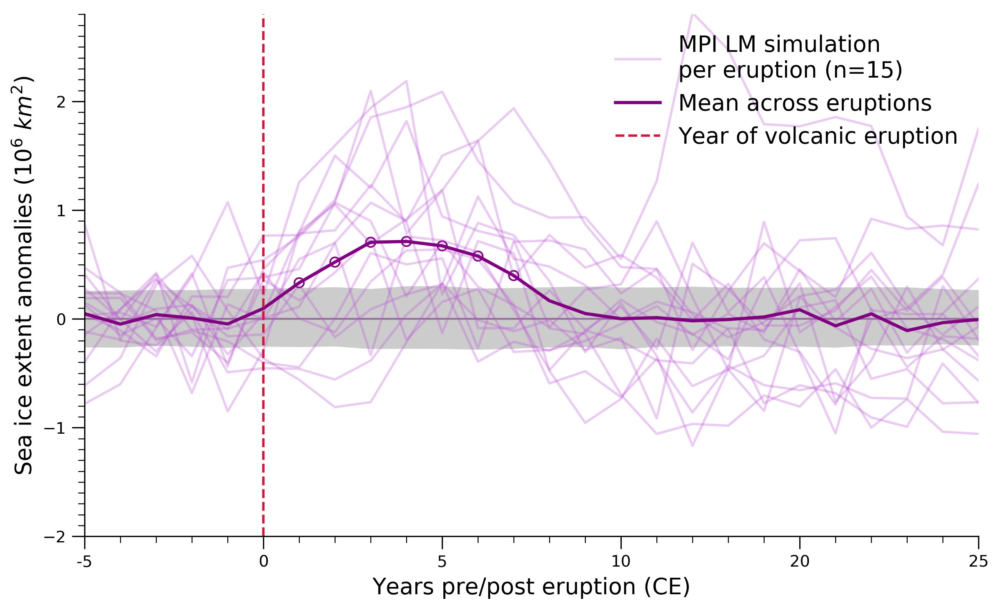

In [42]:
fig = plt.figure(figsize=(10,6))
plt.axhline(0, linestyle='-',color='gray', linewidth=1)

plt.fill_between(np.arange(0,26,1),sie_allit_randcomp_mpi_ensmn_2_5, sie_allit_randcomp_mpi_ensmn_97_5,
                 color='gray',alpha=0.4 ,lw=0.01)

for i in range(nvolc):
    if i is 0: 
        lab = 'MPI LM simulation \nper eruption (n=15)'
    else: 
        lab = ''
    plt.plot(np.arange(0,26,1),sie_allit_volc_mpi[:,i], color='mediumorchid', alpha=0.3,
             label=lab, linewidth=1.5)
plt.plot(np.arange(0,26,1),np.nanmean(sie_allit_volc_mpi,axis=1), 
         color='purple', linewidth=2, label='Mean across eruptions')

for yr in range(26):
    if ttest_sig_mpi[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_allit_volc_mpi,axis=1)[yr], color='purple',
                    marker='o', s=35, facecolors='none')

x = [0,5,10,15,20,25,30]
labels = [-5,0,5,10,20,25]
plt.xticks(x,labels)
plt.xlabel('Years pre/post eruption (CE)', fontsize=14)
plt.ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)', fontsize=14)

ax = plt.gca()
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.tick_params(which='major', length=8)
ax.tick_params(which='minor', length=4)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.axvline(5,color='crimson', linestyle='--', linewidth=1.5, label='Year of volcanic eruption')

plt.legend(frameon=False, fontsize=14)
plt.xlim(0,25)
plt.ylim(-2,2.8)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'volc_sigl_2015_large_norep_composite.png'
#plt.savefig(savedir+savename)

In [ ]:
fig = plt.figure(figsize=(10,7))
plt.axhline(0, linestyle='-',color='gray', linewidth=1)
    
plt.fill_between(np.arange(0,26,1),np.max(sie_allit_volc_2d,axis=1),
                            np.min(sie_allit_volc_2d,axis=1),
                            color='royalblue',alpha=0.1 ,lw=0.01, 
                            label=r'$\bf{Reconstruction:}$'+'\n Min/Max ensemble members \n(2000 per eruption)')
for i in range(nvolc_crowley):
    if i is 0: 
        lab = (r'$\bf{CCSM4}$'+' '+r'$\bf{LM}$'+' '+r'$\bf{simulation}$'+
               '\nper eruption (n='+str(nvolc_gao)+')')
    else: 
        lab = ''
    plt.plot(np.arange(0,26,1),sie_allit_volc_ccsm4_gao[:,i], color='c', alpha=0.2,
                        label=lab, linewidth=1.5)
    
    
plt.plot(np.arange(0,26,1),np.nanmean(sie_enmn_allvolc,axis=1), 
                    color='navy', linewidth=2.5, 
                    label=r'$\bf{Reconstruction:}$'+'\nMean across eruptions \n and ensemble members')
plt.plot(np.arange(0,26,1),np.nanmean(sie_allit_volc_ccsm4_gao,axis=1), 
                   color='teal', linewidth=2.5, label=(r'$\bf{CCSM4}$'+' '+r'$\bf{LM}$'+' '+r'$\bf{simulation}$'+
                                                    '\nMean across eruptions'))

for yr in range(26):
    if ttest_sig[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_enmn_allvolc,axis=1)[yr], color='navy',
                    marker='o', s=35, facecolors='none')
    if ttest_sig_ccsm4_26[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_allit_volc_ccsm4_gao,axis=1)[yr], color='teal',
                    marker='o', s=35, facecolors='none')

x = [0,5,10,15,20,25,30]
labels = [-5,0,5,10,20,25]
plt.xticks(x,labels)
plt.xlabel('Years pre/post eruption (CE)', fontsize=16)
plt.ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)', fontsize=16)

ax = plt.gca()
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.tick_params(which='major', length=8)
ax.tick_params(which='minor', length=4)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.axvline(5,color='crimson', linestyle='--', linewidth=1.5, 
            label=(r'$\bf{Year}$'+' '+r'$\bf{of}$'+' '+r'$\bf{volcanic}$'+' '+r'$\bf{eruption}$'))

handles, labels = plt.gca().get_legend_handles_labels()
h = [handles[4],handles[1],handles[2],handles[0],handles[3]]
l = [labels[4],labels[1],labels[2],labels[0],labels[3]]

plt.legend(h,l, bbox_to_anchor=(1.0, 0.7), frameon=False,fontsize=14,)

# plt.legend(frameon=False, fontsize=16, bbox_to_anchor=[1,1])
# handles,labels = ax_hist[0].get_legend_handles_labels()
# labels = [labels[5], labels[6], labels[7], labels[0], labels[3], labels[2], labels[4], labels[1]]
# handles = [handles[5], handles[6], handles[7], handles[0], handles[3], handles[2], handles[4], handles[1]]

# plt.legend(handles = [handle1, handle2, handle3, handle4],bbox_to_anchor=(1.0, 0.7), frameon=False)

plt.xlim(0,25)
plt.ylim(-1.5,2.0)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'volc_sigl_2015_large_norep_composite_ccsm4.png'
#plt.savefig(savedir+savename)

## Forcing datasets: 

In [534]:
volc_mpi_dir = '/home/disk/chaos/mkb22/Documents/SeaIceData/volcanic_forcing_data/MPIlm/'
filename_mpi = 'crowley2013so4-nh.txt'

In [535]:
import pandas as pd
df = pd.read_csv(volc_mpi_dir+filename_mpi, delimiter = "\t",skiprows=78)

In [536]:
df['flux_rank'] = df['SO4_flux'].rank(method='first',ascending=False)
dff = df.set_index('flux_rank')
Df = dff.sort_index(ascending=True)
Df.head()

,age_AD,SO4_flux,notes
flux_rank,,,
1.0,1257.70,113.6,tropical
2.0,1228.00,35.0,NaN
3.0,1600.00,35.0,tropical
4.0,1815.27,32.4,tropical (Tamb)
5.0,1667.64,23.2,NaN


In [630]:
df_top = Df.loc[0:51,:]

# Outside 850-1850: 
DF_top = df_top.drop([38])
DF_top = DF_top.drop([12])
DF_top = DF_top.drop([17])
DF_top = DF_top.drop([23])
DF_top = DF_top.drop([28])
DF_top = DF_top.drop([24])
DF_top = DF_top.drop([16])
DF_top = DF_top.drop([19])
DF_top = DF_top.drop([31])
DF_top = DF_top.drop([32])
DF_top = DF_top.drop([45])

# Too close together: 
DF_top = DF_top.drop([20])
DF_top = DF_top.drop([7])
DF_top = DF_top.drop([18])
DF_top = DF_top.drop([14])
DF_top = DF_top.drop([48])
DF_top = DF_top.drop([2])
DF_top = DF_top.drop([49])
DF_top = DF_top.drop([46])
DF_top = DF_top.drop([4])
DF_top = DF_top.drop([6])
DF_top = DF_top.drop([35])
DF_top = DF_top.drop([40])
DF_top = DF_top.drop([26])
DF_top = DF_top.drop([43])
DF_top = DF_top.drop([22])
DF_top = DF_top.drop([42])
DF_top = DF_top.drop([29])
DF_top = DF_top.drop([5])
DF_top = DF_top.drop([34])
DF_top = DF_top.drop([27])
DF_top = DF_top.drop([15])
DF_top = DF_top.drop([51])

DF_top

,age_AD,SO4_flux,notes
flux_rank,,,
1.0,1257.70,113.6,tropical
3.0,1600.00,35.0,tropical
8.0,1459.50,22.1,NaN
9.0,1585.00,22.0,NaN
10.0,1286.00,20.4,tropical
11.0,896.50,19.5,tropical
13.0,1783.73,17.9,NaN
21.0,1060.00,15.1,NaN
25.0,971.00,13.8,tropical


In [631]:
# df_top = Df.loc[0:41,:]
# DF_top = df_top.drop([12])
# DF_top = DF_top.drop([17])
# DF_top = DF_top.drop([23])
# DF_top = DF_top.drop([28])
# DF_top = DF_top.drop([24])
# DF_top = DF_top.drop([16])
# DF_top = DF_top.drop([19])
# DF_top = DF_top.drop([31])
# DF_top = DF_top.drop([32])
# DF_top = DF_top.drop([20])
# DF_top = DF_top.drop([7])
# DF_top = DF_top.drop([18])
# DF_top = DF_top.drop([14])
# DF_top = DF_top.drop([29])
# DF_top = DF_top.drop([5])
# DF_top = DF_top.drop([4])
# DF_top = DF_top.drop([6])
# DF_top = DF_top.drop([35])
# DF_top = DF_top.drop([40])
# DF_top = DF_top.drop([38])


# DF_top

In [632]:
y_sorted = np.sort(DF_top['age_AD'].values)
y_sorted[:-1]-y_sorted[1:]

array([ -14.5 ,  -29.3 ,  -30.7 ,  -35.  ,  -54.  ,  -58.  ,  -51.7 ,
        -88.  ,  -28.3 ,  -26.  , -129.5 ,  -18.  ,  -66.2 ,  -59.3 ,
        -15.  ,  -21.5 , -162.23])

In [633]:
y_sorted

array([ 896.5 ,  911.  ,  940.3 ,  971.  , 1006.  , 1060.  , 1118.  ,
       1169.7 , 1257.7 , 1286.  , 1312.  , 1441.5 , 1459.5 , 1525.7 ,
       1585.  , 1600.  , 1621.5 , 1783.73])

In [634]:
age_AD = np.floor(DF_top['age_AD'].values)
crowley_years = np.array([int(i) for i in age_AD])
crowley_SO4_flux = DF_top['SO4_flux'].values

In [635]:
crowley_SO4_flux_plot = np.zeros((1000))

for i in range(len(crowley_years)):
    ind_yr = int(crowley_years[i]-850)
    crowley_SO4_flux_plot[ind_yr] = crowley_SO4_flux[i]

Text(0.5,1,'Crowley et al. 2008 Volcanic Forcing')

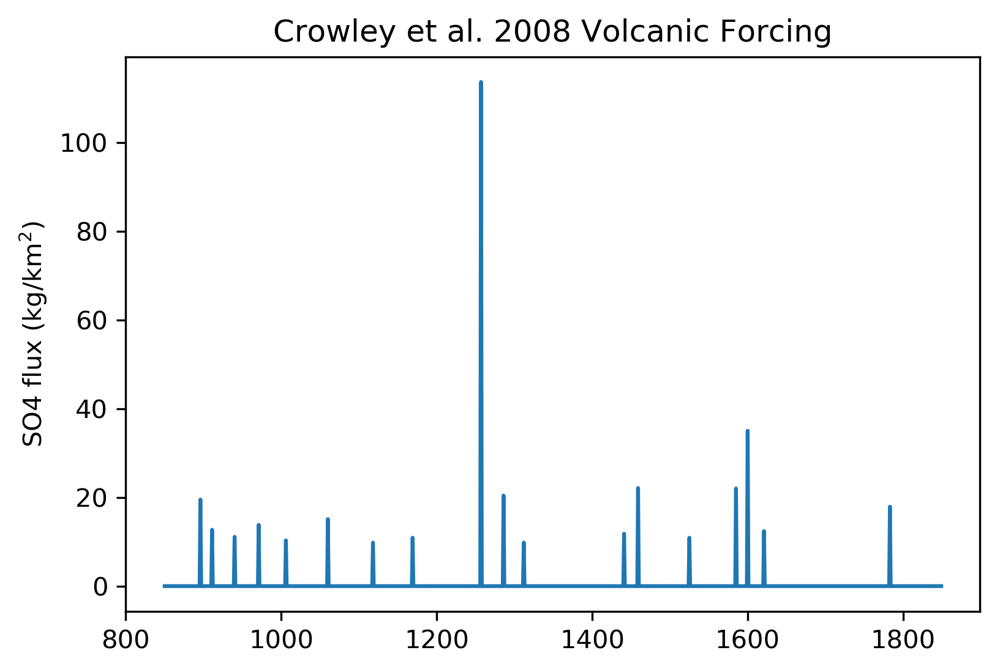

In [636]:
plt.plot(np.arange(850,1850,1),crowley_SO4_flux_plot)
plt.ylabel('SO4 flux (kg/km$^2$)')
plt.title('Crowley et al. 2008 Volcanic Forcing')

## MPI LM composite on Crowley et al. 2008 top 26 eruptions: 

In [733]:
nvolc_crowley = len(crowley_years)
sie_allit_volc_mpi_crowley = np.zeros((26,nvolc))

for i,volc_yr in enumerate(crowley_years):
    lm_volc_yr = volc_yr - 850

    mn_mpi_crowley = np.nanmean(sie_nh_mpi_anom[int(lm_volc_yr-5):lm_volc_yr],axis=0) 
    sie_allit_volc_mpi_crowley[:,i] = sie_nh_mpi_anom[int(lm_volc_yr-5):int(lm_volc_yr+21)] - mn_mpi_crowley

In [742]:
nvolc_crowley

18

In [639]:
sz = 26
sie_allit_randcomp_mpi_ensmn_crowley = np.zeros((1000,26))

for rn in range(1000):
    sigtest_yrs = np.random.randint(5,1000-21,size=sz)
    sie_allit_randcomp_mpi_crowley = np.zeros((26,sz))

    for i,volc_yr in enumerate(sigtest_yrs):
        mn_mpi_crowley = np.nanmean( sie_nh_ccsm4_truth_anom[int(volc_yr-5):volc_yr],axis=0) 
        sie_allit_randcomp_mpi_crowley[:,i] =  sie_nh_mpi_anom[int(volc_yr-5):int(volc_yr+21)] - mn_mpi_crowley

    sie_allit_randcomp_mpi_ensmn_crowley[rn, :] = np.nanmean(sie_allit_randcomp_mpi_crowley,axis=1)

In [640]:
sie_allit_randcomp_mpi_ensmn_97_5_crowley = np.percentile(sie_allit_randcomp_mpi_ensmn_crowley,97.5,axis=0)
sie_allit_randcomp_mpi_ensmn_2_5_crowley = np.percentile(sie_allit_randcomp_mpi_ensmn_crowley,2.5,axis=0)

In [641]:
# sie_enmn_allvolc = np.nanmean(sie_allit_volc,axis=2)

stat_crowley, p_crowley = stats.ttest_1samp(sie_allit_volc_mpi_crowley,0, axis=1)
ttest_sig_mpi_26 = (p_crowley<0.05)
p_crowley

array([1.00872481e-01, 7.10897173e-01, 6.28177549e-01, 4.11540970e-01,
       4.55096786e-01, 8.87498217e-01, 3.09305832e-01, 3.87375349e-04,
       7.56102812e-05, 3.86137955e-02, 2.73340350e-03, 2.26592910e-02,
       3.66213508e-01, 5.56777896e-01, 7.12230831e-01, 7.85763200e-01,
       9.27011565e-01, 8.09188445e-01, 4.21209411e-01, 7.25806422e-01,
       2.63584107e-01, 6.68169187e-01, 4.14218989e-01, 7.60393760e-01,
       1.80370762e-01, 3.05935377e-01])

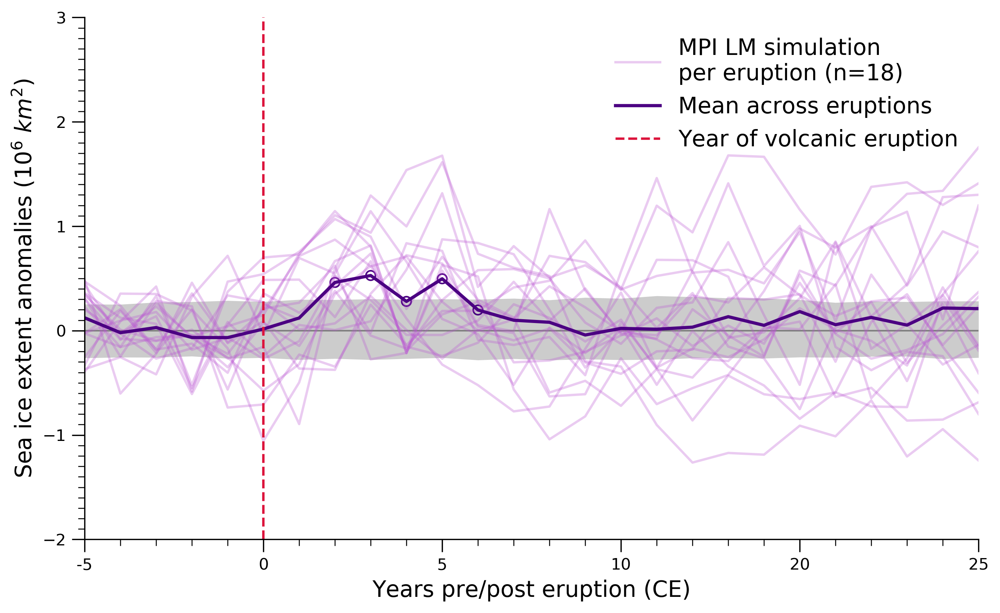

In [642]:
fig = plt.figure(figsize=(10,6))
plt.axhline(0, linestyle='-',color='gray', linewidth=1)

plt.fill_between(np.arange(0,26,1),sie_allit_randcomp_mpi_ensmn_2_5_crowley, 
                 sie_allit_randcomp_mpi_ensmn_97_5_crowley,
                 color='gray',alpha=0.4 ,lw=0.01)

for i in range(nvolc_crowley):
    if i is 0: 
        lab = ('MPI LM simulation \nper eruption (n='+str(len(crowley_years))+')')
    else: 
        lab = ''
    plt.plot(np.arange(0,26,1),sie_allit_volc_mpi_crowley[:,i], color='mediumorchid', alpha=0.3,
             label=lab, linewidth=1.5)
plt.plot(np.arange(0,26,1),np.nanmean(sie_allit_volc_mpi_crowley,axis=1), 
         color='indigo', linewidth=2, label='Mean across eruptions')

for yr in range(26):
    if ttest_sig_mpi_26[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_allit_volc_mpi_crowley,axis=1)[yr], color='indigo',
                    marker='o', s=35, facecolors='none')

x = [0,5,10,15,20,25,30]
labels = [-5,0,5,10,20,25]
plt.xticks(x,labels)
plt.xlabel('Years pre/post eruption (CE)', fontsize=14)
plt.ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)', fontsize=14)

ax = plt.gca()
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.tick_params(which='major', length=8)
ax.tick_params(which='minor', length=4)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.axvline(5,color='crimson', linestyle='--', linewidth=1.5, label='Year of volcanic eruption')

plt.legend(frameon=False, fontsize=14, loc='upper right')
plt.xlim(0,25)
plt.ylim(-2,3)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'volc_sigl_2015_large_norep_composite.png'
#plt.savefig(savedir+savename)

## CCSM4 LM composite on Gao et al. 2008 top 26 eruptions: 

In [195]:
volc_ccsm4_dir = '/home/disk/chaos/mkb22/Documents/SeaIceData/volcanic_forcing_data/CCSM4_lm/'
filename_ccsm4 = 'gao_etal_2008_IVI2.csv'

df = pd.read_csv(volc_ccsm4_dir+filename_ccsm4)
DF =df.drop(columns=['Unnamed: 0'])

In [196]:
DF['flux_rank'] = DF['NH'].rank(method='first',ascending=False)
dff = DF.set_index('flux_rank')
Df_gao = dff.sort_index(ascending=True)
Df_gao.head()

,Year,NH,SH,Global,Revised?
flux_rank,,,,,
1.0,1258.0,145.80,112.11,257.91,\
2.0,1783.0,92.96,0.00,92.96,\
3.0,529.0,59.64,5.04,64.69,\
4.0,1815.0,58.69,51.03,109.72,\
5.0,1227.0,58.64,8.88,67.52,\


In [677]:
df_gao_top = Df_gao.loc[1:58,:]

# Outside 850-1850: 
DF_gao_top = df_gao_top.drop([3])
DF_gao_top = DF_gao_top.drop([21])
DF_gao_top = DF_gao_top.drop([28])
DF_gao_top = DF_gao_top.drop([14])
DF_gao_top = DF_gao_top.drop([20])
DF_gao_top = DF_gao_top.drop([23])
DF_gao_top = DF_gao_top.drop([31])
DF_gao_top = DF_gao_top.drop([32])
DF_gao_top = DF_gao_top.drop([33])
DF_gao_top = DF_gao_top.drop([34])
DF_gao_top = DF_gao_top.drop([35])
DF_gao_top = DF_gao_top.drop([38])
DF_gao_top = DF_gao_top.drop([40])
DF_gao_top = DF_gao_top.drop([45])
DF_gao_top = DF_gao_top.drop([48])
DF_gao_top = DF_gao_top.drop([54])
DF_gao_top = DF_gao_top.drop([55])

DF_gao_top = DF_gao_top.drop([53])
DF_gao_top = DF_gao_top.drop([22])
DF_gao_top = DF_gao_top.drop([19])
DF_gao_top = DF_gao_top.drop([43])
DF_gao_top = DF_gao_top.drop([41])
DF_gao_top = DF_gao_top.drop([24])
DF_gao_top = DF_gao_top.drop([13])
DF_gao_top = DF_gao_top.drop([4])
DF_gao_top = DF_gao_top.drop([39])
DF_gao_top = DF_gao_top.drop([36])
DF_gao_top = DF_gao_top.drop([8])
DF_gao_top = DF_gao_top.drop([17])
DF_gao_top = DF_gao_top.drop([25])
DF_gao_top = DF_gao_top.drop([56])

# DF_gao_top = DF_gao_top.drop([19])
# DF_gao_top = DF_gao_top.drop([43])
# DF_gao_top = DF_gao_top.drop([45])
# DF_gao_top = DF_gao_top.drop([48])
# DF_gao_top = DF_gao_top.drop([38])
# DF_gao_top = DF_gao_top.drop([40])

DF_gao_top

,Year,NH,SH,Global,Revised?
flux_rank,,,,,
1.0,1258.0,145.80,112.11,257.91,\
2.0,1783.0,92.96,0.00,92.96,\
5.0,1227.0,58.64,8.88,67.52,\
6.0,1600.0,46.08,10.51,56.59,\
7.0,1176.0,45.76,0.00,45.76,\
9.0,1641.0,33.81,17.79,51.60,\
10.0,933.0,31.83,0.00,31.83,***\
11.0,1719.0,31.48,0.00,31.48,\
12.0,1167.0,29.54,22.58,52.12,\


In [678]:
# df_gao_top = Df_gao.loc[1:52,:]
# DF_gao_top = df_gao_top.drop([3])
# DF_gao_top = DF_gao_top.drop([21])
# DF_gao_top = DF_gao_top.drop([28])
# DF_gao_top = DF_gao_top.drop([14])
# DF_gao_top = DF_gao_top.drop([20])
# DF_gao_top = DF_gao_top.drop([23])
# DF_gao_top = DF_gao_top.drop([32])
# DF_gao_top = DF_gao_top.drop([33])
# DF_gao_top = DF_gao_top.drop([34])
# DF_gao_top = DF_gao_top.drop([35])
# DF_gao_top = DF_gao_top.drop([31])
# DF_gao_top = DF_gao_top.drop([30])
# DF_gao_top = DF_gao_top.drop([37])
# DF_gao_top = DF_gao_top.drop([12])
# DF_gao_top = DF_gao_top.drop([7])
# DF_gao_top = DF_gao_top.drop([17])
# DF_gao_top = DF_gao_top.drop([24])
# DF_gao_top = DF_gao_top.drop([39])
# DF_gao_top = DF_gao_top.drop([36])
# DF_gao_top = DF_gao_top.drop([13])
# DF_gao_top = DF_gao_top.drop([4])
# DF_gao_top = DF_gao_top.drop([19])
# DF_gao_top = DF_gao_top.drop([43])
# DF_gao_top = DF_gao_top.drop([45])
# DF_gao_top = DF_gao_top.drop([48])
# DF_gao_top = DF_gao_top.drop([38])
# DF_gao_top = DF_gao_top.drop([40])

# DF_gao_top

In [679]:
y_sort = np.sort((DF_gao_top['Year'].values))

y_sort[:-1] - y_sort[1:]

array([-28., -31.,  -9., -17., -63., -41., -45.,  -9., -30., -21., -31.,
       -17.,  -9., -44., -13., -29., -46., -96., -72., -16., -41., -32.,
       -46., -10., -54., -13.])

In [680]:
y_sort

array([ 933.,  961.,  992., 1001., 1018., 1081., 1122., 1167., 1176.,
       1206., 1227., 1258., 1275., 1284., 1328., 1341., 1370., 1416.,
       1512., 1584., 1600., 1641., 1673., 1719., 1729., 1783., 1796.])

In [681]:
1122.-1167

-45.0

Text(0.5,1,'Gao et al. 2008 Volcanic Forcing')

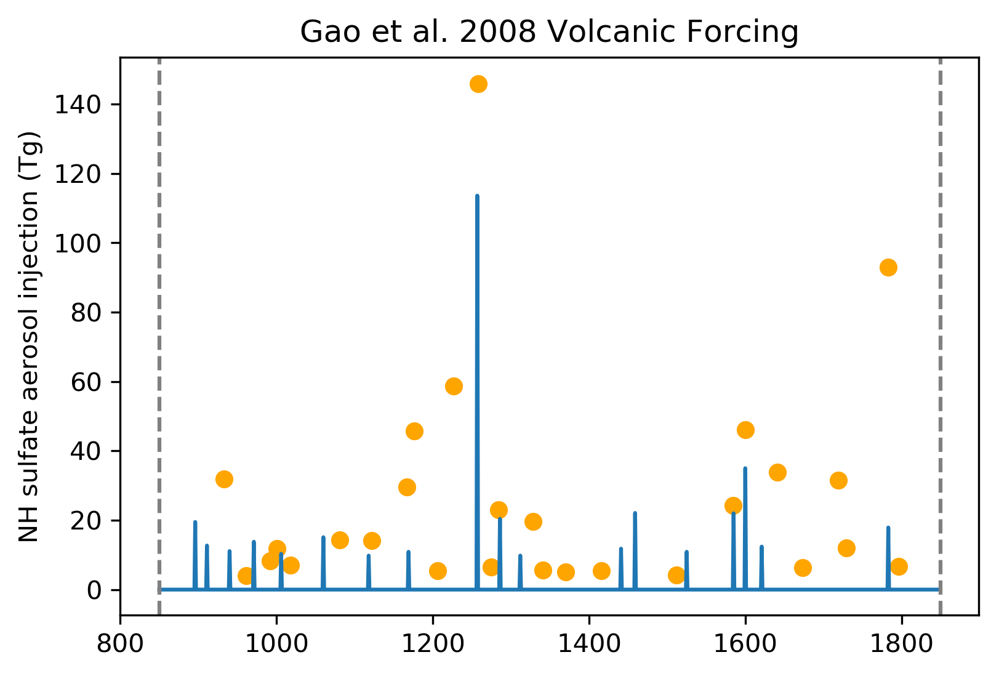

In [682]:
plt.plot(np.arange(850,1850,1),crowley_SO4_flux_plot)
plt.scatter(DF_gao_top['Year'].values,DF_gao_top['NH'].values, color='orange')
plt.axvline(850,linestyle='--',color='grey')
plt.axvline(1850,linestyle='--',color='grey')

plt.ylabel('NH sulfate aerosol injection (Tg)')
plt.title('Gao et al. 2008 Volcanic Forcing')

In [683]:
time_gao = np.floor(DF_gao_top['Year'].values)
gao_years = np.array([int(i) for i in time_gao])
gao_NH_SO4_flux = DF_gao_top['NH'].values

In [684]:
gao_SO4_flux_plot = np.zeros((1000))

for i in range(len(gao_years)):
    ind_yr = int(gao_years[i]-850)
    gao_SO4_flux_plot[ind_yr] = gao_NH_SO4_flux[i]

In [734]:
nvolc_gao = len(gao_years)
sie_allit_volc_ccsm4_gao = np.zeros((26,nvolc_gao))

for i,volc_yr in enumerate(gao_years):
    lm_volc_yr = volc_yr - 850
    mn_ccsm4_gao = np.nanmean(sie_nh_ccsm4_truth_anom[int(lm_volc_yr-5):lm_volc_yr],axis=0) 
    sie_allit_volc_ccsm4_gao[:,i] = sie_nh_ccsm4_truth_anom[int(lm_volc_yr-5):int(lm_volc_yr+21)] - mn_ccsm4_gao

In [686]:
sz = 26
sie_allit_randcomp_ccsm4_ensmn_gao = np.zeros((1000,26))

for rn in range(1000):
    sigtest_yrs = np.random.randint(5,1000-21,size=sz)
    sie_allit_randcomp_ccsm4_gao = np.zeros((26,sz))

    for i,volc_yr in enumerate(sigtest_yrs):
        mn_ccsm4_gao = np.nanmean( sie_nh_ccsm4_truth_anom[int(volc_yr-5):volc_yr],axis=0) 
        sie_allit_randcomp_ccsm4_gao[:,i] =  sie_nh_ccsm4_truth_anom[int(volc_yr-5):int(volc_yr+21)] - mn_ccsm4_gao

    sie_allit_randcomp_ccsm4_ensmn_gao[rn, :] = np.nanmean(sie_allit_randcomp_ccsm4_gao,axis=1)

In [687]:
sie_allit_randcomp_ccsm4_ensmn_97_5_gao = np.percentile(sie_allit_randcomp_ccsm4_ensmn_gao,97.5,axis=0)
sie_allit_randcomp_ccsm4_ensmn_2_5_gao = np.percentile(sie_allit_randcomp_ccsm4_ensmn_gao,2.5,axis=0)

In [688]:
# sie_enmn_allvolc = np.nanmean(sie_allit_volc,axis=2)

stat_gao, p_gao = stats.ttest_1samp(sie_allit_volc_ccsm4_gao,0, axis=1)
ttest_sig_ccsm4_26 = (p_gao<0.05)
p_gao

array([0.87202567, 0.62692079, 0.4505607 , 0.08567333, 0.7119466 ,
       0.88348265, 0.14218797, 0.00897037, 0.01821038, 0.01479727,
       0.01313477, 0.00814486, 0.0492466 , 0.37026675, 0.06149698,
       0.03377457, 0.1309489 , 0.28833443, 0.06817575, 0.09150133,
       0.4903875 , 0.97949756, 0.68668421, 0.90058366, 0.26018421,
       0.59700232])

In [713]:
ttest_sig_ccsm4_26[12] = False

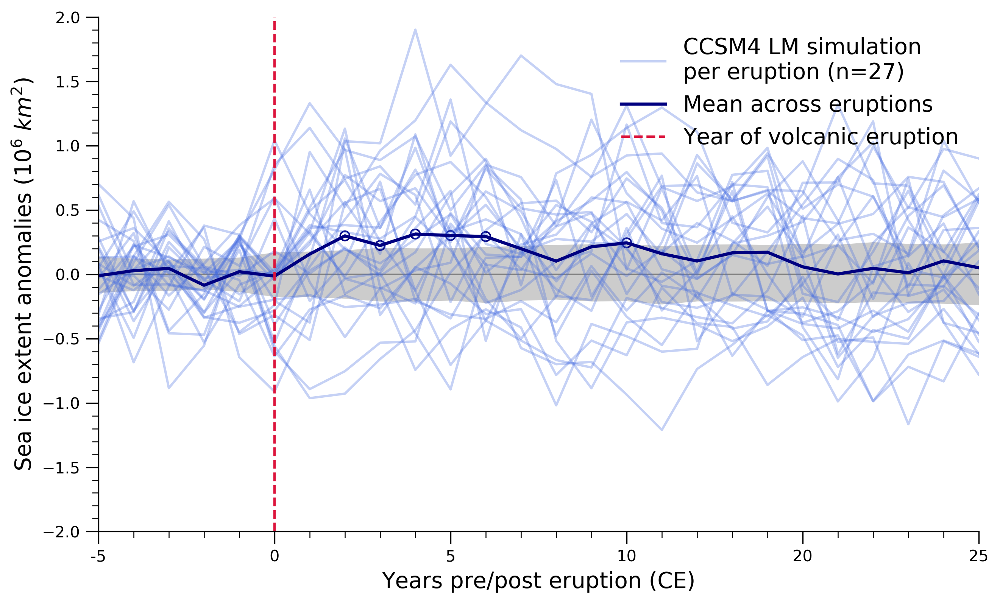

In [744]:
fig = plt.figure(figsize=(10,6))
plt.axhline(0, linestyle='-',color='gray', linewidth=1)

plt.fill_between(np.arange(0,26,1),sie_allit_randcomp_ccsm4_ensmn_2_5_gao, 
                 sie_allit_randcomp_ccsm4_ensmn_97_5_gao,
                 color='gray',alpha=0.4 ,lw=0.01)

for i in range(nvolc_gao):
    if i is 0: 
        lab = 'CCSM4 LM simulation \nper eruption (n='+str(nvolc_gao)+')'
    else: 
        lab = ''
    plt.plot(np.arange(0,26,1),sie_allit_volc_ccsm4_gao[:,i], color='royalblue', alpha=0.3,
             label=lab, linewidth=1.5)
plt.plot(np.arange(0,26,1),np.nanmean(sie_allit_volc_ccsm4_gao,axis=1), 
         color='navy', linewidth=2, label='Mean across eruptions')

for yr in range(26):
    if ttest_sig_ccsm4_26[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_allit_volc_ccsm4_gao,axis=1)[yr], color='navy',
                    marker='o', s=35, facecolors='none')

x = [0,5,10,15,20,25,30]
labels = [-5,0,5,10,20,25]
plt.xticks(x,labels)
plt.xlabel('Years pre/post eruption (CE)', fontsize=14)
plt.ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)', fontsize=14)

ax = plt.gca()
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.tick_params(which='major', length=8)
ax.tick_params(which='minor', length=4)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.axvline(5,color='crimson', linestyle='--', linewidth=1.5, label='Year of volcanic eruption')

plt.legend(frameon=False, fontsize=14, loc='upper right')
plt.xlim(0,25)
plt.ylim(-2,2)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'volc_sigl_2015_large_norep_composite.png'
#plt.savefig(savedir+savename)

In [309]:
sie_allit_randcomp_ccsm4_ensmn_2_5_gao[15:26], np.nanmean(sie_allit_volc_ccsm4_gao,axis=1)[15:26]

(array([-0.22175944, -0.21853235, -0.22647181, -0.2195148 , -0.23497715,
        -0.21896641, -0.20978977, -0.22877175, -0.21788269, -0.22812146,
        -0.23338708]),
 array([ 0.00797758, -0.0657188 , -0.20380155, -0.08973182, -0.11892236,
        -0.08130661, -0.21148758, -0.25214899, -0.23052654, -0.14044075,
        -0.19441449]))

In [708]:
sie_allit_randcomp_ccsm4_ensmn_97_5_gao[4:7], p_gao[4:7], np.nanmean(sie_allit_volc_ccsm4_gao,axis=1)[4:7]

(array([0.13204052, 0.1720482 , 0.17888207]),
 array([0.7119466 , 0.88348265, 0.14218797]),
 array([ 0.0205564 , -0.01376363,  0.15734865]))

## Comparing volcanic timing: 

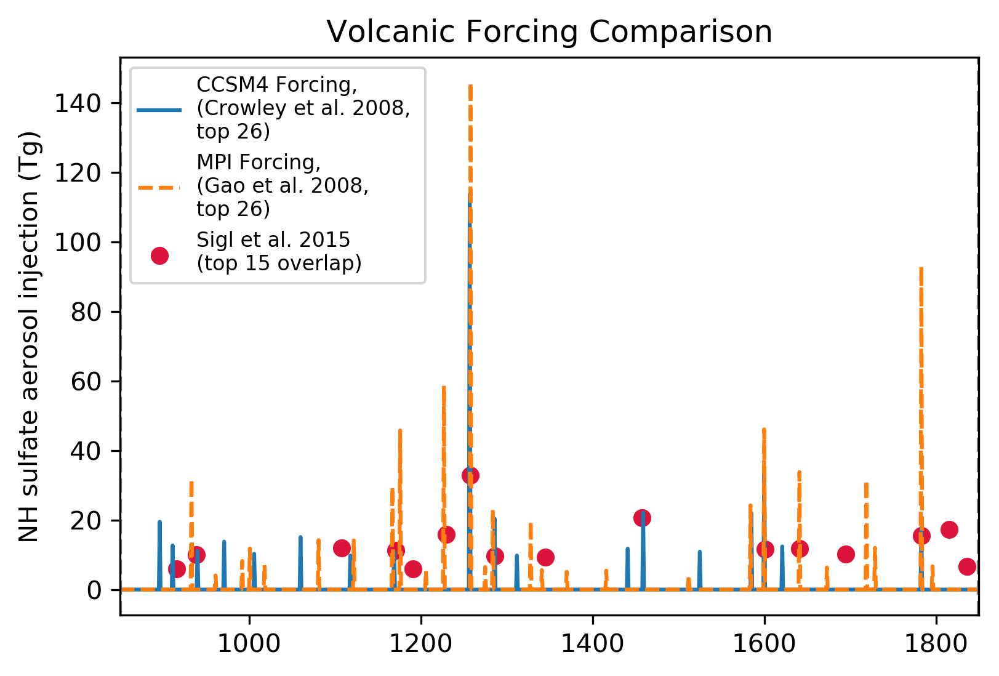

In [690]:
plt.plot(np.arange(850,1850,1),crowley_SO4_flux_plot, label='CCSM4 Forcing,\n(Crowley et al. 2008, \ntop 26)')
plt.plot(np.arange(850,1850,1),gao_SO4_flux_plot, linestyle='--',label='MPI Forcing, \n(Gao et al. 2008, \ntop 26)')
# plt.scatter(gao_years,gao_NH_SO4_flux , color='k', 
#             label='Gao et al. 2008 \n(top 26)')
gao_NH_SO4_flux 
plt.scatter(lm_volc_40,np.array(lm_volc_forc_40)*-1, color='crimson', label='Sigl et al. 2015 \n(top 15 overlap)')
plt.axvline(850,linestyle='--',color='grey')
plt.axvline(1850,linestyle='--',color='grey')

plt.xlim(850,1850)

plt.ylabel('NH sulfate aerosol injection (Tg)')
plt.title('Volcanic Forcing Comparison')

plt.legend(fontsize=8)

In [691]:
lm_volc_40,np.array(lm_volc_forc_40)*-1

([916,
  939,
  1108,
  1171,
  1191,
  1230,
  1258,
  1286,
  1345,
  1458,
  1601,
  1641,
  1695,
  1783,
  1815,
  1836],
 array([ 5.9, 10.1, 12. , 11.3,  5.9, 15.9, 32.8,  9.7,  9.4, 20.6, 11.6,
        11.8, 10.2, 15.5, 17.2,  6.6]))

27

In [692]:
output_dir_ccsm4 = '/home/disk/p/mkb22/nobackup/LMR_output/common_era_experiments/experiments/ccsm4/'
output_file_ccsm4 = 'sic_ccsm4_anrecon_0_2000_pages2kv2_inf2_6_loc15000_iter0.pkl'

niter = 10

[sic_lalo_allit_ccsm4, tas_lalo_allit_ccsm4, sic_ens_var_allit_ccsm4, 
 nobs_allit_ccsm4, sia_ens_allit_ccsm4, sie_ens_allit_ccsm4, Ye_assim_allit_ccsm4, 
 Ye_assim_coords_allit_ccsm4, Xb_inflate_allit_ccsm4, recon_years_ccsm4, 
 proxy_assim_loc_allit_ccsm4] = load_recon_allit(output_dir_ccsm4,output_file_ccsm4,niter)

In [693]:
[sie_ens_allit_2d_ccsm4, 
 sie_ens_anom_allit_ccsm4, 
 sie_ensmn_anom_allit_ccsm4, 
 sie_97_5_allit_ccsm4, 
 sie_2_5_allit_ccsm4] = recon_preprocess(sie_ens_allit_ccsm4, np.array(recon_years_ccsm4), anom_start, anom_end)

In [694]:
nvolc = len(volc_40_time_norep)
sie_allit_volc = np.zeros((26,nvolc,2000))

for i,volc_yr in enumerate(volc_40_time_norep):
    mn = np.nanmean(sie_ens_allit_2d_ccsm4[int(volc_yr-5):volc_yr,:],axis=0) 
    sie_allit_volc[:,i,:] = sie_ens_allit_2d_ccsm4[int(volc_yr-5):int(volc_yr+21),:] - mn

sie_allit_volc_2d = np.reshape(sie_allit_volc,(26,nvolc*2000))
sie_enmn_allvolc_2d = np.nanmean(sie_allit_volc_2d,axis=1)

In [695]:
sie_enmn_allvolc = np.nanmean(sie_allit_volc,axis=2)

stat, p = stats.ttest_1samp(sie_enmn_allvolc,0, axis=1)
ttest_sig = (p<0.05)
p

array([2.78276958e-01, 5.92553817e-01, 1.36529406e-01, 1.58227878e-01,
       3.97435387e-01, 5.57798975e-04, 6.91808036e-04, 2.99155193e-03,
       2.30027121e-03, 1.53417620e-01, 6.26265169e-03, 1.22400759e-01,
       1.56683990e-01, 3.65398082e-01, 8.48259860e-01, 5.22827722e-01,
       9.43867090e-01, 2.85142138e-01, 9.83480986e-01, 9.67014918e-01,
       8.25601003e-01, 9.84562959e-01, 4.47097332e-01, 8.60258954e-01,
       4.59100195e-01, 5.30745024e-01])

In [696]:
sz = 26
sie_allit_randcomp_ensmn = np.zeros((1000,26))

for rn in range(1000):
    sigtest_yrs = np.random.randint(5,2000-21,size=sz)
    sie_allit_randcomp = np.zeros((26,sz,2000))

    for i,volc_yr in enumerate(sigtest_yrs):
        mn = np.nanmean(sie_ens_allit_2d_ccsm4[int(volc_yr-5):volc_yr,:],axis=0) 
        sie_allit_randcomp[:,i,:] = sie_ens_allit_2d_ccsm4[int(volc_yr-5):int(volc_yr+21),:] - mn

    sie_allit_randcomp_ensmn[rn, :] = np.nanmean(np.nanmean(sie_allit_randcomp,axis=2),axis=1)

In [697]:
sie_allit_randcomp_ensmn_97_5 = np.percentile(sie_allit_randcomp_ensmn,97.5,axis=0)
sie_allit_randcomp_ensmn_2_5 = np.percentile(sie_allit_randcomp_ensmn,2.5,axis=0)

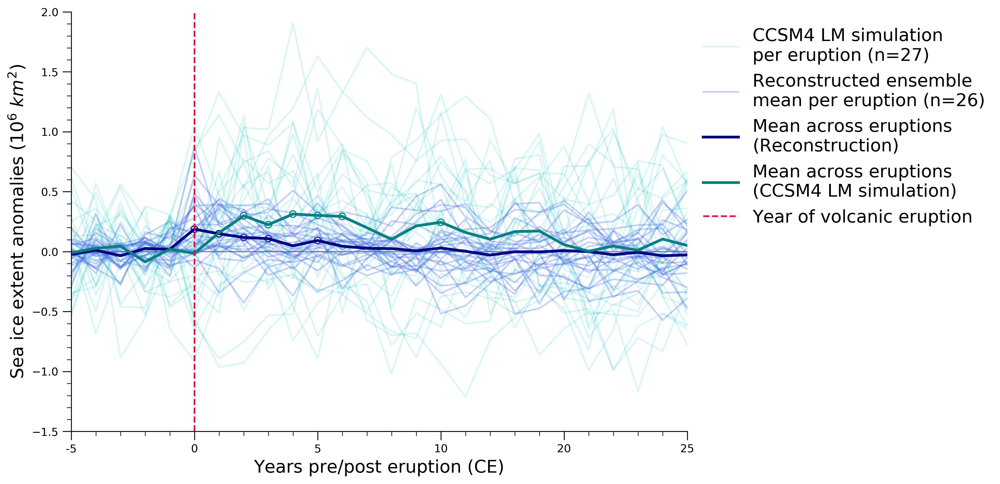

In [741]:
fig = plt.figure(figsize=(10,7))
plt.axhline(0, linestyle='-',color='gray', linewidth=1)

# plt.fill_between(np.arange(0,26,1),sie_allit_randcomp_ensmn_2_5, sie_allit_randcomp_ensmn_97_5,
#                  color='gray',alpha=0.4 ,lw=0.01)
        
# plt.fill_between(np.arange(0,26,1),sie_allit_randcomp_ccsm4_ensmn_2_5_gao, 
#                  sie_allit_randcomp_ccsm4_ensmn_97_5_gao,
#                  color='c',alpha=0.3 ,lw=0.01)

for i in range(nvolc):
    if i is 0: 
        lab = 'CCSM4 LM simulation \nper eruption (n='+str(nvolc_gao)+')'
    else: 
        lab = ''
    plt.plot(np.arange(0,26,1),sie_allit_volc_ccsm4_gao[:,i], color='c', alpha=0.15,
             label=lab, linewidth=1.5)

for i in range(nvolc):
    if i is 0: 
        lab = 'Reconstructed ensemble \nmean per eruption (n=26)'
    else: 
        lab = ''
    plt.plot(np.arange(0,26,1),sie_enmn_allvolc[:,i], color='royalblue', alpha=0.3,
             label=lab, linewidth=1.5)
    
plt.plot(np.arange(0,26,1),np.nanmean(sie_enmn_allvolc,axis=1), 
         color='navy', linewidth=2.5, label='Mean across eruptions \n(Reconstruction)')
plt.plot(np.arange(0,26,1),np.nanmean(sie_allit_volc_ccsm4_gao,axis=1), 
         color='teal', linewidth=2.5, label='Mean across eruptions \n(CCSM4 LM simulation)')   

for yr in range(26):
    if ttest_sig[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_enmn_allvolc,axis=1)[yr], color='navy',
                    marker='o', s=35, facecolors='none')  
for yr in range(26):
    if ttest_sig_ccsm4_26[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_allit_volc_ccsm4_gao,axis=1)[yr], color='teal',
                    marker='o', s=35, facecolors='none') 

        


x = [0,5,10,15,20,25,30]
labels = [-5,0,5,10,20,25]
plt.xticks(x,labels)
plt.xlabel('Years pre/post eruption (CE)', fontsize=16)
plt.ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)', fontsize=16)

ax = plt.gca()
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.tick_params(which='major', length=8)
ax.tick_params(which='minor', length=4)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.axvline(5,color='crimson', linestyle='--', linewidth=1.5, label='Year of volcanic eruption')

plt.legend(frameon=False, fontsize=16, bbox_to_anchor=[1,1])
plt.xlim(0,25)
plt.ylim(-1.5,2.0)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'volc_sigl_2015_large_norep_composite.png'
#plt.savefig(savedir+savename)

In [719]:
output_dir_mpi = '/home/disk/p/mkb22/nobackup/LMR_output/common_era_experiments/experiments/mpi/'
#output_file_mpi = 'sic_mpi_anrecon_0_2000_pages2kv2_inf1_8_loc15000_iter0.pkl'
output_file_mpi = 'sic_mpi_anrecon_revisions1_0_2000_pages2kv2_inf1_8_loc15000_iter0.pkl'

[sic_lalo_allit_mpi, tas_lalo_allit_mpi, sic_ens_var_allit_mpi, 
 nobs_allit_mpi, sia_ens_allit_mpi, sie_ens_allit_mpi, Ye_assim_allit_mpi, 
 Ye_assim_coords_allit_mpi, Xb_inflate_allit_mpi, recon_years, 
 proxy_assim_loc_allit_mpi] = load_recon_allit(output_dir_mpi,output_file_mpi,niter)

In [720]:
[sie_ens_allit_2d_mpi, 
 sie_ens_anom_allit_mpi, 
 sie_ensmn_anom_allit_mpi, 
 sie_97_5_allit_mpi, 
 sie_2_5_allit_mpi] = recon_preprocess(sie_ens_allit_mpi, np.array(recon_years), anom_start, anom_end)

In [721]:
nvolc = len(volc_40_time_norep)
sie_allit_volc_mpi = np.zeros((26,nvolc,2000))

for i,volc_yr in enumerate(volc_40_time_norep):
    mn_mpi = np.nanmean(sie_ens_allit_2d_mpi[int(volc_yr-5):volc_yr,:],axis=0) 
    sie_allit_volc_mpi[:,i,:] = sie_ens_allit_2d_mpi[int(volc_yr-5):int(volc_yr+21),:] - mn_mpi

sie_allit_volc_2d_mpi = np.reshape(sie_allit_volc_mpi,(26,nvolc*2000))
sie_enmn_allvolc_2d_mpi = np.nanmean(sie_allit_volc_2d_mpi,axis=1)

In [722]:
sie_enmn_allvolc_mpi = np.nanmean(sie_allit_volc_mpi,axis=2)

stat_mpi, p_mpi = stats.ttest_1samp(sie_enmn_allvolc_mpi,0, axis=1)
ttest_sig_mpi = (p_mpi<0.05)
p_mpi

array([9.46906881e-01, 7.83859420e-01, 2.57252653e-01, 4.82136318e-01,
       4.96448196e-01, 1.27344503e-03, 1.02193203e-03, 2.43736489e-03,
       6.61148967e-04, 3.38116526e-02, 7.10606524e-04, 1.33394399e-02,
       2.68020940e-02, 2.23802273e-01, 9.81754193e-01, 8.22385951e-01,
       4.31314920e-01, 8.31611460e-01, 7.16569028e-01, 5.41289468e-01,
       6.71525743e-01, 4.98653467e-01, 9.96864181e-01, 9.95846044e-01,
       8.32988106e-01, 5.81730728e-01])

In [728]:
ttest_sig_mpi[12] = False

In [723]:
sie_allit_randcomp_ensmn_mpi = np.zeros((1000,26))

for rn in range(1000):
    sigtest_yrs = np.random.randint(5,2000-21,size=sz)
    sie_allit_randcomp_mpi = np.zeros((26,sz,2000))

    for i,volc_yr in enumerate(sigtest_yrs):
        mn_mpi = np.nanmean(sie_ens_allit_2d_mpi[int(volc_yr-5):volc_yr,:],axis=0) 
        sie_allit_randcomp_mpi[:,i,:] = sie_ens_allit_2d_mpi[int(volc_yr-5):int(volc_yr+21),:] - mn_mpi

    sie_allit_randcomp_ensmn_mpi[rn, :] = np.nanmean(np.nanmean(sie_allit_randcomp_mpi,axis=2),axis=1)

In [724]:
sie_allit_randcomp_ensmn_97_5_mpi = np.percentile(sie_allit_randcomp_ensmn_mpi,97.5,axis=0)
sie_allit_randcomp_ensmn_2_5_mpi = np.percentile(sie_allit_randcomp_ensmn_mpi,2.5,axis=0)

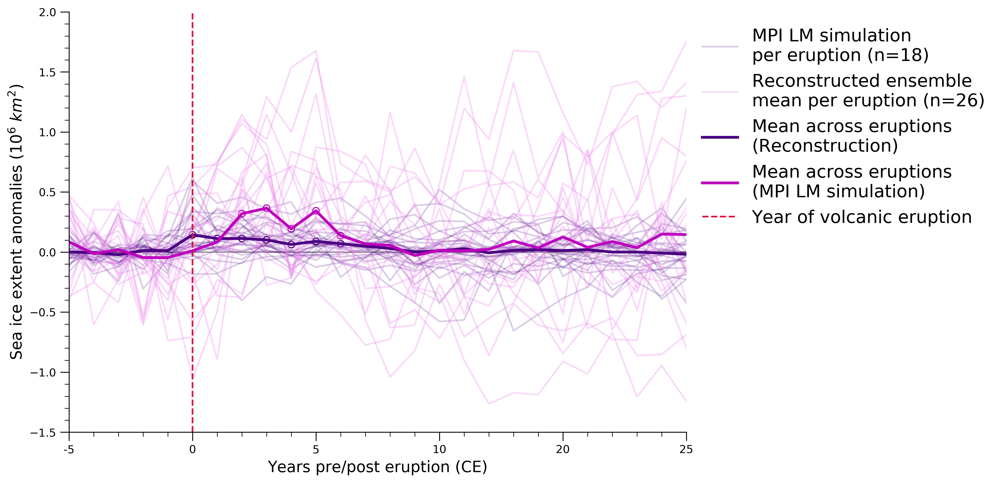

In [749]:
fig = plt.figure(figsize=(10,7))
plt.axhline(0, linestyle='-',color='gray', linewidth=1)

# plt.fill_between(np.arange(0,26,1),sie_allit_randcomp_ensmn_2_5_mpi, sie_allit_randcomp_ensmn_97_5_mpi,
#                  color='gray',alpha=0.4 ,lw=0.01)

for i in range(nvolc):
    if i is 0: 
        lab = 'MPI LM simulation \nper eruption (n='+str(nvolc_crowley)+')'
    else: 
        lab = ''
    plt.plot(np.arange(0,26,1),sie_enmn_allvolc_mpi[:,i], color='indigo', alpha=0.2,
             label=lab, linewidth=1.5)
for i in range(nvolc_crowley):
    if i is 0: 
        lab = 'Reconstructed ensemble \nmean per eruption (n=26)'
    else: 
        lab = ''
    plt.plot(np.arange(0,26,1),sie_allit_volc_mpi_crowley[:,i], color='violet', alpha=0.3,
             label=lab, linewidth=1.5)
    
    
plt.plot(np.arange(0,26,1),np.nanmean(sie_enmn_allvolc_mpi,axis=1), 
         color='indigo', linewidth=2.5, label='Mean across eruptions \n(Reconstruction)')
plt.plot(np.arange(0,26,1),np.nanmean(sie_allit_volc_mpi_crowley,axis=1), 
         color='m', linewidth=2.5, label='Mean across eruptions \n(MPI LM simulation)')

for yr in range(26):
    if ttest_sig_mpi[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_enmn_allvolc_mpi,axis=1)[yr], color='indigo',
                    marker='o', s=35, facecolors='none')
    if ttest_sig_mpi_26[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_allit_volc_mpi_crowley,axis=1)[yr], color='m',
                    marker='o', s=35, facecolors='none')

x = [0,5,10,15,20,25,30]
labels = [-5,0,5,10,20,25]
plt.xticks(x,labels)
plt.xlabel('Years pre/post eruption (CE)', fontsize=14)
plt.ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)', fontsize=14)

ax = plt.gca()
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.tick_params(which='major', length=8)
ax.tick_params(which='minor', length=4)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.axvline(5,color='crimson', linestyle='--', linewidth=1.5, label='Year of volcanic eruption')

plt.legend(frameon=False, fontsize=16, bbox_to_anchor=[1,1])
plt.xlim(0,25)
plt.ylim(-1.5,2.0)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'volc_sigl_2015_large_norep_composite_mpi.png'
#plt.savefig(savedir+savename)

In [727]:
np.nanmean(sie_enmn_allvolc_mpi,axis=1)[10:13], sie_allit_randcomp_ensmn_97_5_mpi[10:13]

(array([0.08951104, 0.06976983, 0.04942498]),
 array([0.06441142, 0.0590441 , 0.0586786 ]))

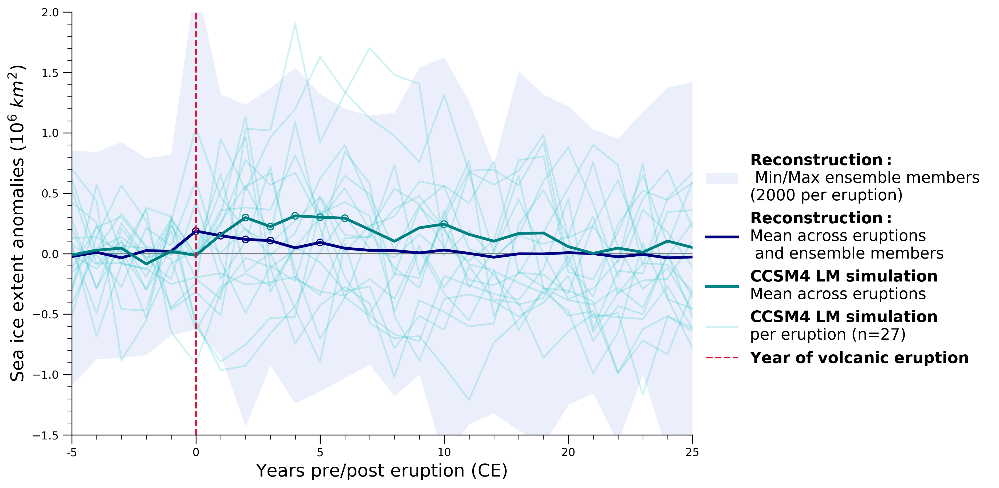

In [797]:
fig = plt.figure(figsize=(10,7))
plt.axhline(0, linestyle='-',color='gray', linewidth=1)
    
plt.fill_between(np.arange(0,26,1),np.max(sie_allit_volc_2d,axis=1),
                            np.min(sie_allit_volc_2d,axis=1),
                            color='royalblue',alpha=0.1 ,lw=0.01, 
                            label=r'$\bf{Reconstruction:}$'+'\n Min/Max ensemble members \n(2000 per eruption)')
for i in range(nvolc_crowley):
    if i is 0: 
        lab = (r'$\bf{CCSM4}$'+' '+r'$\bf{LM}$'+' '+r'$\bf{simulation}$'+
               '\nper eruption (n='+str(nvolc_gao)+')')
    else: 
        lab = ''
    plt.plot(np.arange(0,26,1),sie_allit_volc_ccsm4_gao[:,i], color='c', alpha=0.2,
                        label=lab, linewidth=1.5)
    
    
plt.plot(np.arange(0,26,1),np.nanmean(sie_enmn_allvolc,axis=1), 
                    color='navy', linewidth=2.5, 
                    label=r'$\bf{Reconstruction:}$'+'\nMean across eruptions \n and ensemble members')
plt.plot(np.arange(0,26,1),np.nanmean(sie_allit_volc_ccsm4_gao,axis=1), 
                   color='teal', linewidth=2.5, label=(r'$\bf{CCSM4}$'+' '+r'$\bf{LM}$'+' '+r'$\bf{simulation}$'+
                                                    '\nMean across eruptions'))

for yr in range(26):
    if ttest_sig[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_enmn_allvolc,axis=1)[yr], color='navy',
                    marker='o', s=35, facecolors='none')
    if ttest_sig_ccsm4_26[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_allit_volc_ccsm4_gao,axis=1)[yr], color='teal',
                    marker='o', s=35, facecolors='none')

x = [0,5,10,15,20,25,30]
labels = [-5,0,5,10,20,25]
plt.xticks(x,labels)
plt.xlabel('Years pre/post eruption (CE)', fontsize=16)
plt.ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)', fontsize=16)

ax = plt.gca()
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.tick_params(which='major', length=8)
ax.tick_params(which='minor', length=4)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.axvline(5,color='crimson', linestyle='--', linewidth=1.5, 
            label=(r'$\bf{Year}$'+' '+r'$\bf{of}$'+' '+r'$\bf{volcanic}$'+' '+r'$\bf{eruption}$'))

handles, labels = plt.gca().get_legend_handles_labels()
h = [handles[4],handles[1],handles[2],handles[0],handles[3]]
l = [labels[4],labels[1],labels[2],labels[0],labels[3]]

plt.legend(h,l, bbox_to_anchor=(1.0, 0.7), frameon=False,fontsize=14,)

# plt.legend(frameon=False, fontsize=16, bbox_to_anchor=[1,1])
# handles,labels = ax_hist[0].get_legend_handles_labels()
# labels = [labels[5], labels[6], labels[7], labels[0], labels[3], labels[2], labels[4], labels[1]]
# handles = [handles[5], handles[6], handles[7], handles[0], handles[3], handles[2], handles[4], handles[1]]

# plt.legend(handles = [handle1, handle2, handle3, handle4],bbox_to_anchor=(1.0, 0.7), frameon=False)

plt.xlim(0,25)
plt.ylim(-1.5,2.0)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'volc_sigl_2015_large_norep_composite_ccsm4.png'
#plt.savefig(savedir+savename)

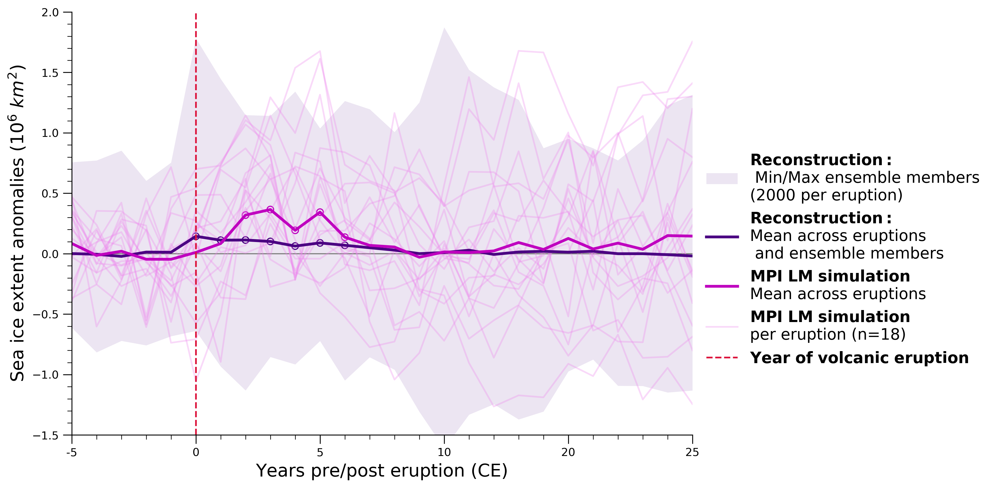

In [792]:
fig = plt.figure(figsize=(10,7))
plt.axhline(0, linestyle='-',color='gray', linewidth=1)
    
plt.fill_between(np.arange(0,26,1),np.max(sie_allit_volc_2d_mpi,axis=1),
                            np.min(sie_allit_volc_2d_mpi,axis=1),
                            color='indigo',alpha=0.1 ,lw=0.01, 
                            label=r'$\bf{Reconstruction:}$'+'\n Min/Max ensemble members \n(2000 per eruption)')
for i in range(nvolc_crowley):
    if i is 0: 
        lab = (r'$\bf{MPI}$'+' '+r'$\bf{LM}$'+' '+r'$\bf{simulation}$'+
               '\nper eruption (n='+str(nvolc_crowley)+')')
    else: 
        lab = ''
    plt.plot(np.arange(0,26,1),sie_allit_volc_mpi_crowley[:,i], color='violet', alpha=0.3,
                        label=lab, linewidth=1.5)
    
    
plt.plot(np.arange(0,26,1),np.nanmean(sie_enmn_allvolc_mpi,axis=1), 
                    color='indigo', linewidth=2.5, 
                    label=r'$\bf{Reconstruction:}$'+'\nMean across eruptions \n and ensemble members')
plt.plot(np.arange(0,26,1),np.nanmean(sie_allit_volc_mpi_crowley,axis=1), 
                   color='m', linewidth=2.5, label=(r'$\bf{MPI}$'+' '+r'$\bf{LM}$'+' '+r'$\bf{simulation}$'+
                                                    '\nMean across eruptions'))

for yr in range(26):
    if ttest_sig_mpi[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_enmn_allvolc_mpi,axis=1)[yr], color='indigo',
                    marker='o', s=35, facecolors='none')
    if ttest_sig_mpi_26[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_allit_volc_mpi_crowley,axis=1)[yr], color='m',
                    marker='o', s=35, facecolors='none')

x = [0,5,10,15,20,25,30]
labels = [-5,0,5,10,20,25]
plt.xticks(x,labels)
plt.xlabel('Years pre/post eruption (CE)', fontsize=16)
plt.ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)', fontsize=16)

ax = plt.gca()
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.tick_params(which='major', length=8)
ax.tick_params(which='minor', length=4)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.axvline(5,color='crimson', linestyle='--', linewidth=1.5,  
            label=(r'$\bf{Year}$'+' '+r'$\bf{of}$'+' '+r'$\bf{volcanic}$'+' '+r'$\bf{eruption}$'))

handles, labels = plt.gca().get_legend_handles_labels()
h = [handles[4],handles[1],handles[2],handles[0],handles[3]]
l = [labels[4],labels[1],labels[2],labels[0],labels[3]]

plt.legend(h,l, bbox_to_anchor=(1.0, 0.7), frameon=False,fontsize=14,)

# plt.legend(frameon=False, fontsize=16, bbox_to_anchor=[1,1])
# handles,labels = ax_hist[0].get_legend_handles_labels()
# labels = [labels[5], labels[6], labels[7], labels[0], labels[3], labels[2], labels[4], labels[1]]
# handles = [handles[5], handles[6], handles[7], handles[0], handles[3], handles[2], handles[4], handles[1]]

# plt.legend(handles = [handle1, handle2, handle3, handle4],bbox_to_anchor=(1.0, 0.7), frameon=False)

plt.xlim(0,25)
plt.ylim(-1.5,2.0)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'volc_sigl_2015_large_norep_composite_mpi.png'
#plt.savefig(savedir+savename)

In [781]:
labels

['$\\bf{MPI}$ $\\bf{LM}$ $\\bf{simulation}$\nper eruption (n=18)',
 '$\\bf{Reconstruction:}$\nMean across eruptions \n and ensemble members',
 '$\\bf{MPI}$ $\\bf{LM}$ $\\bf{simulation}$\nMean across eruptions',
 'Year of volcanic eruption',
 '$\\bf{Reconstruction:}$\n Min/Max ensemble members \n(2000 per eruption)']

## Figure S6

In [ ]:
sigl_topnh_full_forc_norep = np.zeros((2001))
sigl_toptrop_full_forc_norep = np.zeros((2001))

for yr in volc_40_time_norep: 
    if yr in list(sigl_40lg_yr_nh):
        sigl_topnh_full_forc_norep[yr] = sigl_40lg_forc_full[yr]
    elif yr in list(sigl_40lg_yr_trop):
        sigl_toptrop_full_forc_norep[yr] = sigl_40lg_forc_full[yr]

In [ ]:
len(np.where(sigl_toptrop_full_forc_norep<0.0)[0]), len(np.where(sigl_topnh_full_forc_norep<0.0)[0])

In [ ]:
Wn2 = 1.0/20
nf2 = 7
b2,a2 = signal.butter(nf2,Wn2,btype='lowpass')
w2, h2 = signal.freqs(b2, a2)
sie_ccsm4_filt20 = signal.filtfilt(b2,a2,sie_ensmn_anom_allit_ccsm4)

In [ ]:
fig, (ax_recon,ax_prox) = plt.subplots(2, figsize=(11,8),sharex=True,
                                       gridspec_kw={"height_ratios": (.75,.25)})

ax_recon.axhline(0,linestyle='--',color='grey')

#ax_recon.fill_between(recon_years_ccsm4,sie_2_5_allit_ccsm4,sie_97_5_allit_ccsm4,color='gray',lw=0.01,alpha=0.5)

# ax_recon.axvline(1450)
# ax_recon.axvline(1850)

ax_recon.plot(recon_years_ccsm4,sie_ensmn_anom_allit_ccsm4,color='k',#'#107ab0',
         label='Reconstruction - CCSM4, Pages2kv2',linewidth=1)
ax_recon.plot(recon_years_ccsm4,sie_ccsm4_filt20,color='royalblue',#'#107ab0',
         label='20-year lowpass filtered',linewidth=2)

ax_recon.set_ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)',fontsize=14)
#ax_recon.set_xlabel('Year (CE)',fontsize=14)

ax_recon.legend(fontsize=13,bbox_to_anchor=(0.49, 1),frameon=False)
#plt.ylim(7,13.1,1)

ax_recon.set_xlim(0,2020)
ax_recon.set_ylim(-1.0,2.5)

sigl_40lg_yr_nh
ax_prox.plot(sigl_toptrop_full_forc_norep, label='Tropical eruptions, n=20',
             color='mediumaquamarine', linewidth=2.5)
ax_prox.plot(sigl_topnh_full_forc_norep, label='Northern hemisphere eruptions, n=6',
             color='darkgreen', linewidth=2.5)
ax_prox.set_xlabel('Year (CE)', fontsize=14)
ax_prox.set_ylabel('Global Volcanic \naerosol forcing \n(W/m$^2$)', fontsize=12)
ax_prox.invert_yaxis()
ax_prox.set_ylim(0,-35)
ax_prox.legend(loc='upper left', frameon=False)

ax_prox.xaxis.grid(linestyle='--')
ax_recon.xaxis.grid(linestyle='--')

plt.subplots_adjust(wspace=0, hspace=0.05)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'Recon_ccsm4_0_2000_volc_40large_sigl_norep.png'
#plt.savefig(savedir+savename)